# MIRA Lab 1 Muhammad Kabir Hamzah,  Faisal Farhan
*Robert Martí and Sandra González-Villà*


---


## Intensity-based image registration
In this notebook you have the code of a fully working registration framework, implementing a rigid registration algorithm which minimizes the sum of squared distances (SSD). Read and understand the following functions and answer the questions asked through the notebook. Then, complete the assigned tasks.

In [1]:
from scipy.optimize import minimize
from scipy.ndimage import map_coordinates
from skimage.color import rgb2gray
from skimage.io import imread
import matplotlib.pyplot as plt
import numpy as np
from skimage.transform import rescale
from scipy.ndimage import sobel
import datetime

In [2]:
def affine_transform_2d_double(Iin, M, order=3, mode=2, ImageSize=None):

    boundaries = ['reflect', 'grid-mirror', 'constant', 'grid-constant',
                  'nearest', 'mirror', 'grid-wrap', 'wrap']

    if ImageSize is None:
        ImageSize = [Iin.shape[0], Iin.shape[1]]

    if order not in np.arange(6):
        raise ValueError('Invalid order value')

    if mode not in np.arange(8):
        raise ValueError('Invalid mode value')

    boundary = boundaries[mode] # default = constant

    x, y = np.meshgrid(np.arange(ImageSize[1]), np.arange(ImageSize[0]))

    mean_out = np.array(ImageSize) / 2
    mean_in = np.array(Iin.shape[:2]) / 2

    xd = x - mean_out[1]
    yd = y - mean_out[0]

    Tlocalx = mean_in[1] + M[0, 0] * xd + M[0, 1] * yd + M[0, 2] * 1
    Tlocaly = mean_in[0] + M[1, 0] * xd + M[1, 1] * yd + M[1, 2] * 1

    Iout = map_coordinates(Iin, [Tlocaly, Tlocalx], order=order, mode=boundary)

    return Iout

In [3]:
def affine_registration_function(par, scale, Imoving, Ifixed, mtype, ttype, order):
    x = par * scale
    if ttype == 'r': # rigid transformation
        M = np.array([[np.cos(x[2]), np.sin(x[2]), x[0]],
                      [-np.sin(x[2]), np.cos(x[2]), x[1]],
                      [0, 0, 1]])
    else:
        raise ValueError('Unknown registration type')

    I3 = affine_transform_2d_double(Imoving, M, order)

    if mtype == 'sd':  # squared differences
        e = np.sum((I3 - Ifixed)**2) / I3.size
    else:
        raise ValueError('Unknown metric type')

    return e

In [4]:
def affineReg2D(Imoving_path, Ifixed_path, mtype='sd', ttype='r', tscale=[1,1,0.001], epsilon=0.001, order=3):

    Imoving = rgb2gray(imread(Imoving_path)[:,:,0:3]).astype(np.double)
    Ifixed = rgb2gray(imread(Ifixed_path)[:,:,0:3]).astype(np.double)

    scale = np.array(tscale)

    if ttype == 'r':
        x = np.array([0, 0, 0])
        if scale.size != 3:
          raise ValueError('Invalid scale')

    else:
        raise ValueError('Unknown registration type')

    x = x / scale

    result = minimize(
        lambda par: affine_registration_function(par, scale.astype(np.double), Imoving, Ifixed, mtype, ttype, order),
        x.astype(np.double), options={'eps':epsilon, 'maxls':50},
        method='L-BFGS-B'
    )

    x = result.x
    x = x * scale

    print(f'Parameters: {x}')

    if ttype == 'r': # rigid transformation
        M = np.array([[np.cos(x[2]), np.sin(x[2]), x[0]],
                      [-np.sin(x[2]), np.cos(x[2]), x[1]],
                      [0, 0, 1]])


    Icor = affine_transform_2d_double(Imoving, M, order)


    # Show the registration results
    plt.figure(figsize=(10, 8))

    plt.subplot(2, 2, 1)
    plt.imshow(Ifixed, cmap='gray')
    plt.title('Fixed Image')

    plt.subplot(2, 2, 2)
    plt.imshow(Imoving, cmap='gray')
    plt.title('Moving Image')

    plt.subplot(2, 2, 3)
    plt.imshow(Icor, cmap='gray')
    plt.title('Transformed Moving Image')

    plt.subplot(2, 2, 4)
    plt.imshow(np.abs(Ifixed - Icor), cmap='viridis')
    plt.title(f'Registration Error (mtype={mtype}, ttype={ttype}, scale={scale})')

    plt.tight_layout()
    plt.show()

    return Icor, M

# Some questions about the provided code


**QUESTION 1**: Identify each of the components of the image registration framework, state their <u>type</u> and where they can be found (<u>function</u> and <u>line number</u>)

*Your answer here*
- **ANSWER 1**:

| Component               | Type                                                     | Function                     | Line Number |
|-------------------------|----------------------------------------------------------|------------------------------|-------------|
| Interpolation order     | Cubic interpolation (Spline)                             | affine_transform_2d_double   |      18 (map_coordinates)     |
| Transformation matrix   | Rigid (ttype == 'r')                                     | affine_registration_function |     3-6    |
| Similarity measure      | Objective function (Squared differences (mtype == 'sd')) | affine_registration_function |     10-14   |
| Optimizer               | Limited memory BFGS optimizer (L-BFGS-B)                 | affineReg2D                  |     12-16   |
| Fixed and Moving Images | Image (matrix)                                           | affineReg2D                  |      2-3    |


**QUESTION 2**: What is the function of the `scale` vector?

*Your answer here*

- **ANSWER 2**:
The scale helps balance the magnitudes of different transformation parameters (translation and rotation) during the optimization process. It helps make sure that the optimizer can handle both translation (measured in pixels) and rotation (measured in radians) in a consistent and controlled way. For rigid transformation, the default `tscale` is `[1, 1, 0.001]`, which means:

   - Translation parameters (x and y) are scaled by 1
   
   - Rotation parameter is scaled by 0.001



**QUESTION 3**: Where is the center of rotation of the transformation?

*Your answer here*
- **ANSWER 3**:
The center of rotation in the transformation process is the center of the image. In the code you've written, when a rotation is applied to the image, it's done around the center of the image, not the top-left corner (which is the default origin in many image systems). This is achieved by shifting the image coordinates so that the center of the image is treated as the origin for the transformation. The matrix transformation assumes that the rotation happens around the center of the image for a more intuitive and accurate result, especially in image registration. This is done in step 8 of affine_transform_2d_double:
  - xd = x - mean_out[1]  # Shift x-coordinates
  
  - yd = y - mean_out[0]  # Shift y-coordinates

# Perform a test registration


In [5]:
# from google.colab import files

#Load the four brain images provided with the notebook
# uploaded = files.upload()

Parameters: [ 2.18970320e+01 -2.39967496e+01 -1.83637572e-05]


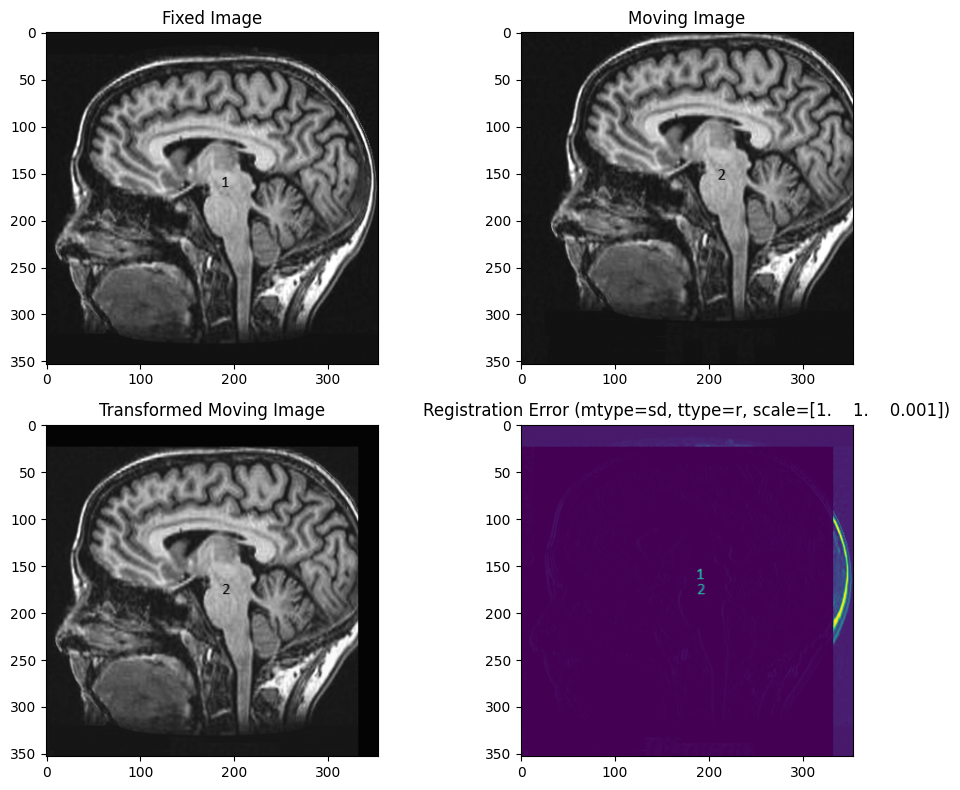


Registration took 5 sec.


In [6]:
import datetime

start = datetime.datetime.now()
Iregistered, transformation_matrix = affineReg2D("brain2.png", "brain1.png", 'sd', 'r')
end = datetime.datetime.now()

print(f'\nRegistration took {(end-start).seconds} sec.')

# Let's add some extra functionality to the framework

**TASK 1**: Add two new similarity metrics to the framework:

1.   Normalized cross-correlation (NCC)
2.   Normalized gradient correlation (NGC)

In [7]:
# Your code here
# NORMALIZED CROSS CORRELATION FUNCTION AND NORMALIZED GRADIENT CORRELATION FUNCTION
def normalized_cross_correlation(A, B):
    """
    Computes the Normalized Cross-Correlation (NCC) between two images.
    
    Parameters:
    A, B : ndarray
        Input images (grayscale) as NumPy arrays of the same shape.
        
    Returns:
    R : float
        The Normalized Cross-Correlation value.
    """
    # Ensure A and B are of the same size
    assert A.shape == B.shape, "Images must be of the same dimensions"

    # Calculate means of both images
    I_A_mean = np.mean(A)
    I_B_mean = np.mean(B)

    # Calculate numerator and denominator of the NCC formula
    numerator = np.sum(np.abs((A - I_A_mean) * (B - I_B_mean)))
    denominator = np.sqrt(np.sum((A - I_A_mean)**2) * np.sum((B - I_B_mean)**2))
    
    if denominator == 0 or np.isnan(denominator):
        return 0.0
    ncc = numerator / denominator
    
    return -ncc


def compute_ngc(imgA, imgB):
    """
    Computes the Normalized Gradient Correlation (NGC) between two images using Sobel gradients.

    Parameters:
      imgA, imgB : ndarray
        Input images (grayscale) as NumPy arrays of the same shape.

    Returns:
    ngc_value : float
        The Normalized Gradient Correlation value.
    """
    # Compute gradients using Sobel operator
    imgA_x_grad = sobel(imgA, axis=1)
    imgA_y_grad = sobel(imgA, axis=0)
    imgB_x_grad = sobel(imgB, axis=1)
    imgB_y_grad = sobel(imgB, axis=0)

    imgA_x_grad = imgA_x_grad/np.max(imgA_x_grad)
    imgA_y_grad = imgA_y_grad/np.max(imgA_y_grad)
    imgB_x_grad = imgB_x_grad/np.max(imgB_x_grad)   
    imgB_y_grad = imgB_y_grad/np.max(imgB_y_grad)
    
    # Compute numerator
    # numerator = np.sum(imgA_x_grad * imgB_x_grad + imgA_y_grad * imgB_y_grad)
    numerator = np.sum(np.abs(imgA_x_grad * imgB_x_grad + imgA_y_grad * imgB_y_grad))

    # Compute denominator
    den1 = np.sum(imgA_x_grad**2 + imgA_y_grad**2)
    den2 = np.sum(imgB_x_grad**2 + imgB_y_grad**2)
    denominator = np.sqrt(den1 * den2)

    # Avoid division by zero
    if denominator == 0 or np.isnan(denominator):
        return 0.0

    ngc_value = numerator / denominator
    
    return -ngc_value

**TASK 2**: Modify the framework to be able to deal with full affine 2D transformations.
   - **QUESTION 4**: Justify how you initialize the transformation.

*Your answer here*
 - **ANSWER 4**:
The affine parameters are set to create an identity transformation initially ([1, 0, 0, 1, 0, 0]), which is an optimal choice as it represents no transformation, allowing the optimizer to determine the best fit. i.e We initialize the translation to start with zero translation ([0, 0]) then we initialize the rotation to zero because with the assumption that the images are roughly oriented similarly. We then scale by [1, 1] (no scaling) and shearing [0, 0] and finally, the centre of rotation to be the image centre.

** Modification for affine transformation below

In [8]:
def affine_transform_2d_double(Iin, M, order=3, mode=2, ImageSize=None):
    boundaries = ['reflect', 'grid-mirror', 'constant', 'grid-constant',
                  'nearest', 'mirror', 'grid-wrap', 'wrap']

    # Set default output size to input size if not specified
    if ImageSize is None:
        ImageSize = [Iin.shape[0], Iin.shape[1]]

    # Validate input parameters
    if order not in np.arange(6):
        raise ValueError('Invalid order value')

    if mode not in np.arange(8):
        raise ValueError('Invalid mode value')

    boundary = boundaries[mode] # default = constant

    # Create coordinate grids
    x, y = np.meshgrid(np.arange(ImageSize[1]), np.arange(ImageSize[0]))

    # Calculate center points
    mean_out = np.array(ImageSize) / 2
    mean_in = np.array(Iin.shape[:2]) / 2

    # Adjust coordinates relative to center
    xd = x - mean_out[1]
    yd = y - mean_out[0]

    # Apply affine transformation
    Tlocalx = mean_in[1] + M[0, 0] * xd + M[0, 1] * yd + M[0, 2] * 1
    Tlocaly = mean_in[0] + M[1, 0] * xd + M[1, 1] * yd + M[1, 2] * 1

    # Interpolate values from input image to output coordinates
    Iout = map_coordinates(Iin, [Tlocaly, Tlocalx], order=order, mode=boundary)

    return Iout

def affine_registration_function(par, scale, Imoving, Ifixed, mtype, ttype, order):
    # Scale the parameters
    x = par * scale
    
    if ttype == 'r':  # rigid transformation
        # Create transformation matrix for rotation and translation
        M = np.array([[np.cos(x[2]), np.sin(x[2]), x[0]],
                      [-np.sin(x[2]), np.cos(x[2]), x[1]],
                      [0, 0, 1]])
    elif ttype == 'a':  # affine transformation
        # Create affine transformation matrix with initialized parameters
        M = np.array([[x[0], x[1], x[4]],
                      [x[2], x[3], x[5]],
                      [0, 0, 1]])
    else:
        raise ValueError('Unknown registration type')

    # Apply transformation to moving image
    I3 = affine_transform_2d_double(Imoving, M, order)

    if mtype == 'sd':  # squared differences
        # Calculate mean squared error
        e = np.sum((I3 - Ifixed)**2) / I3.size
    elif mtype == 'ncc':  # normalized cross-correlation
        # Calculate normalized cross-correlation
        e = normalized_cross_correlation(I3, Ifixed)
    elif mtype == 'ngc':  # normalized gradient correlation
        # Calculate normalized gradient correlation
        e = compute_ngc(I3, Ifixed)
    else:
        raise ValueError('Unknown metric type')
    return e

def affineReg2D(Imoving_path, Ifixed_path, mtype='sd', ttype='r', tscale=[1, 1, 0.001], epsilon=0.001, order=3):
    # Load and convert images to grayscale
    Imoving = rgb2gray(imread(Imoving_path)[:, :, 0:3]).astype(np.double)
    Ifixed = rgb2gray(imread(Ifixed_path)[:, :, 0:3]).astype(np.double)

    scale = np.array(tscale)

    # Initialize transformation parameters
    if ttype == 'r':  # rigid transformation
        x = np.array([0, 0, 0])  # [tx, ty, rotation]
        if scale.size != 3:
            raise ValueError('Invalid scale')
    elif ttype == 'a':  # affine transformation
        x = np.array([1, 0, 0, 1, 0, 0])  # [a11, a12, a21, a22, tx, ty]
        if scale.size != 6:
            raise ValueError('Invalid scale')
    else:
        raise ValueError('Unknown registration type')

    # Scale initial parameters
    x = x / scale
    print(f'Initial Parameters: {x}')
    # Optimize transformation parameters
    start = datetime.datetime.now()
    result = minimize(
        lambda par: affine_registration_function(par, scale.astype(np.double), Imoving, Ifixed, mtype, ttype, order),
        x.astype(np.double), options={'eps': epsilon, 'maxls': 50},
        method='L-BFGS-B'
    )
    end = datetime.datetime.now()
    # Rescale optimized parameters
    x = result.x * scale

    print(f'Final Parameters: {x}')
    print(f'Final Error: {result.fun}')
    print(f'Optimization took {(end-start).seconds} sec.')
    # Construct transformation matrix
    if ttype == 'r':  # rigid transformation
        M = np.array([[np.cos(x[2]), np.sin(x[2]), x[0]],
                      [-np.sin(x[2]), np.cos(x[2]), x[1]],
                      [0, 0, 1]])
    elif ttype == 'a':  # affine transformation
        M = np.array([[x[0], x[1], x[4]],
                      [x[2], x[3], x[5]],
                      [0, 0, 1]])

    # Apply transformation to moving image
    Icor = affine_transform_2d_double(Imoving, M, order)

    # Visualize registration results
    plt.figure(figsize=(10, 8))

    plt.subplot(2, 2, 1)
    plt.imshow(Ifixed, cmap='gray')
    plt.title('Fixed Image')

    plt.subplot(2, 2, 2)
    plt.imshow(Imoving, cmap='gray')
    plt.title('Moving Image')

    plt.subplot(2, 2, 3)
    plt.imshow(Icor, cmap='gray')
    plt.title('Transformed Moving Image')

    plt.subplot(2, 2, 4)
    plt.imshow(np.abs(Ifixed - Icor), cmap='viridis')
    plt.title(f'Registration Error (mtype={mtype}, ttype={ttype}, scale={scale})')

    plt.tight_layout()
    plt.show()

    return Icor, M

Initial Parameters: [0. 0. 0.]
Final Parameters: [ 2.18970320e+01 -2.39967496e+01 -1.83637572e-05]
Final Error: 0.003896235253714959
Optimization took 4 sec.


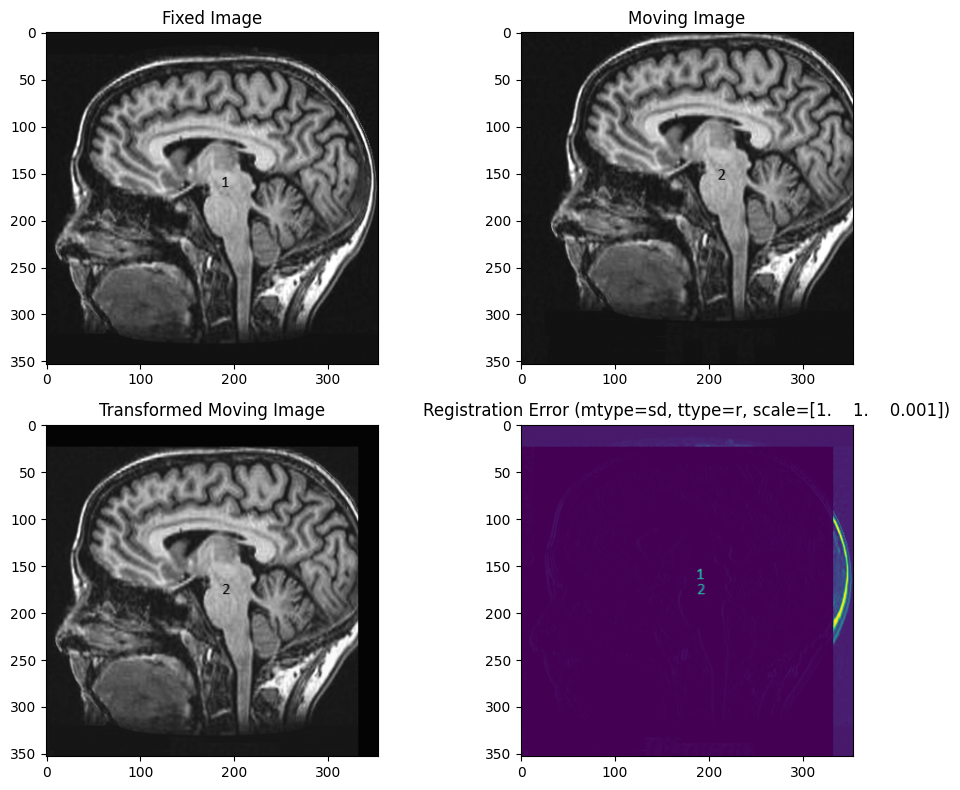


Registration took 5 sec.


In [9]:
start = datetime.datetime.now()
Iregistered, transformation_matrix = affineReg2D(Imoving_path="brain2.png", Ifixed_path="brain1.png", mtype='sd',  ttype='r', tscale=[1, 1, 0.001], epsilon=0.001, order=3)
end = datetime.datetime.now()

print(f'\nRegistration took {(end-start).seconds} sec.')

**TASK 3**: Implement the above modifications in a multi-resolution registration framework. The number of resolutions should be a parameter of the framework.
  - **QUESTION 5**: Discuss how each resolution is initialized.
  - **QUESTION 6**: Justify the benefits of multi-resolution in terms of computation time and/or accuracy of the final result, compared to a single resolution.

- **ANSWER 5**:
In a multi-resolution framework, each image (moving and fixed) is downscaled using a scaling factor (2**resolution-1). The transformation parameters for the first scaled image is initially set to the default values [0, 0, 0] for a rigid transformation and [ 1, 0, 0, 1, 0, 0] for an affine transformation. These parameters are then optimized, the resulting parameters are then used as initial parameters for the next resolution. This process is done progressively until the final resolution. 

- **ANSWER 6**:
To justify the benefits of multi-resolution, we need to compare the result obtained in the single and multi-resolution using the same parameters and images. The test on single resolution has been done in the cell above while the multi-resolution is done below.

** Modification for multi-resolution below

In [10]:
def affine_transform_2d_double(Iin, M, order=3, mode=2, ImageSize=None):
    boundaries = ['reflect', 'grid-mirror', 'constant', 'grid-constant',
                  'nearest', 'mirror', 'grid-wrap', 'wrap']

    # Set default output size to input size if not specified
    if ImageSize is None:
        ImageSize = [Iin.shape[0], Iin.shape[1]]

    # Validate input parameters
    if order not in np.arange(6):
        raise ValueError('Invalid order value')

    if mode not in np.arange(8):
        raise ValueError('Invalid mode value')

    boundary = boundaries[mode] # default = constant

    # Create coordinate grids
    x, y = np.meshgrid(np.arange(ImageSize[1]), np.arange(ImageSize[0]))

    # Calculate center points
    mean_out = np.array(ImageSize) / 2
    mean_in = np.array(Iin.shape[:2]) / 2

    # Adjust coordinates relative to center
    xd = x - mean_out[1]
    yd = y - mean_out[0]

    # Apply affine transformation
    Tlocalx = mean_in[1] + M[0, 0] * xd + M[0, 1] * yd + M[0, 2] * 1
    Tlocaly = mean_in[0] + M[1, 0] * xd + M[1, 1] * yd + M[1, 2] * 1
    
    # Interpolate values from input image to output coordinates
    Iout = map_coordinates(Iin, [Tlocaly, Tlocalx], order=order, mode=boundary)

    return Iout

def affine_registration_function(par, scale, Imoving, Ifixed, mtype, ttype, order):
    # Scale the parameters
    x = par * scale
    global error_list 
    
    if ttype == 'r':  # rigid transformation
        # Create transformation matrix for rotation and translation
        M = np.array([[np.cos(x[2]), np.sin(x[2]), x[0]],
                      [-np.sin(x[2]), np.cos(x[2]), x[1]],
                      [0, 0, 1]])
    elif ttype == 'a':  # affine transformation
        # Create affine transformation matrix with initialized parameters
        M = np.array([[x[0], x[1], x[4]],
                      [x[2], x[3], x[5]],
                      [0, 0, 1]])
    else:
        raise ValueError('Unknown registration type')

    # Apply transformation to moving image
    I3 = affine_transform_2d_double(Imoving, M, order)

    if mtype == 'sd':  # squared differences
        # Calculate mean squared error
        e = np.sum((I3 - Ifixed)**2) / I3.size
        error_list.append(e)
    elif mtype == 'ncc':  # normalized cross-correlation
        # Calculate normalized cross-correlation
        e = normalized_cross_correlation(I3, Ifixed)
        error_list.append(e)
    elif mtype == 'ngc':  # normalized gradient correlation
        # Calculate normalized gradient correlation
        e = compute_ngc(I3, Ifixed)
        error_list.append(e)
    else:
        raise ValueError('Unknown metric type')
    
    return e

def multi_affineReg2D(Imoving_path, Ifixed_path, mtype='sd', ttype='r', tscale=[1, 1, 0.001], epsilon=0.001, order=3, num_resolutions=3):
    """
    Perform 2D affine registration between two images using a multi-resolution approach.

    Parameters:
    - Imoving_path: Path to the moving image
    - Ifixed_path: Path to the fixed image
    - mtype: Metric type ('sd' for squared differences)
    - ttype: Transformation type ('r' for rigid, 'a' for affine)
    - tscale: Scaling factors for transformation parameters
    - epsilon: Convergence criterion for optimization
    - order: Interpolation order
    - num_resolutions: Number of resolutions for the multi-resolution framework

    Returns:
    - Icor: Registered (transformed) moving image
    - M: Transformation matrix
    """

    # Load and convert images to grayscale
    Imoving = rgb2gray(imread(Imoving_path)[:, :, 0:3]).astype(np.double)
    Ifixed = rgb2gray(imread(Ifixed_path)[:, :, 0:3]).astype(np.double)

    scale = np.array(tscale)

    # Initialize transformation parameters
    if ttype == 'r':  # rigid transformation
        x = np.array([0, 0, 0])  # [tx, ty, rotation]
        if scale.size != 3:
            raise ValueError('Invalid scale')
    elif ttype == 'a':  # affine transformation
        x = np.array([1.0, 0.0, 0.0, 1.0, 0.0, 0.0])  # [a11, a12, a21, a22, tx, ty]
        if scale.size != 6:
            raise ValueError('Invalid scale')
    else:
        raise ValueError('Unknown registration type')
    
    # Multi-resolution registration
    iteration_metrics = []
    computation_times = []
    for resolution in range(num_resolutions, 0, -1):
        # print(f'Initial Parameters: {x}')
        # Downscale images
        scaling_factor = 2 ** (resolution - 1)
        Imoving_resized = rescale(Imoving, 1.0 / scaling_factor, anti_aliasing=True)
        Ifixed_resized = rescale(Ifixed, 1.0 / scaling_factor, anti_aliasing=True)

        # Scale initial parameters
        if ttype == 'a':
            x_rescaled = x / (scale * np.asarray([1, 1, 1, 1, scaling_factor, scaling_factor]))
        else:
            x_rescaled = x / (scale * np.asarray([scaling_factor, scaling_factor, 1]))
        start_time = datetime.datetime.now()
        # Optimize transformation parameters for current resolution
        result = minimize(
            lambda par: affine_registration_function(par, scale.astype(np.double), Imoving_resized, Ifixed_resized, mtype, ttype, order),
            x_rescaled.astype(np.double), options={'eps': epsilon, 'maxls': 50},
            method='L-BFGS-B'
        )
        end_time = datetime.datetime.now()

        iteration_metrics.append(result.fun)
        computation_times.append((end_time - start_time).seconds)

        # Rescale optimized parameters
        if ttype == 'a':
            x = result.x * (scale / np.asarray([1, 1, 1, 1, scaling_factor, scaling_factor]))
        else:
            x = result.x * (scale / np.asarray([scaling_factor, scaling_factor, 1]))

        # print(f'Final Parameters: {x}')
        
    # Construct transformation matrix
    if ttype == 'r':  # rigid transformation
        M = np.array([[np.cos(x[2]), np.sin(x[2]), x[0]],
                    [-np.sin(x[2]), np.cos(x[2]), x[1]],
                    [0, 0, 1]])
    elif ttype == 'a':  # affine transformation
        M = np.array([[x[0], x[1], x[4]],
                    [x[2], x[3], x[5]],
                    [0, 0, 1]])

    # Apply transformation to moving image
    Icor = affine_transform_2d_double(Imoving, M, order)

    final_error = iteration_metrics[-1]
    print(f'Final Registration Error: {final_error}')
    # Visualize registration results
    plt.figure(figsize=(10, 8))

    plt.subplot(2, 2, 1)
    plt.imshow(Ifixed, cmap='gray')
    plt.title('Fixed Image')

    plt.subplot(2, 2, 2)
    plt.imshow(Imoving, cmap='gray')
    plt.title('Moving Image')

    plt.subplot(2, 2, 3)
    plt.imshow(Icor, cmap='gray')
    plt.title('Transformed Moving Image')

    plt.subplot(2, 2, 4)
    plt.imshow(np.abs(Ifixed - Icor), cmap='viridis')
    plt.title(f'Registration Error (mtype={mtype}, ttype={ttype}, scale={scale})')

    plt.tight_layout()
    plt.show()
    
    # Plot metrics against iterations
    plt.figure(figsize=(18, 8))
    plt.subplot(1, 2, 1)
    plt.plot(range(1, len(error_list) + 1), error_list, color='green', marker='*', linestyle='-', linewidth=1, markersize=3)
    plt.xlabel('Iterations')
    plt.ylabel('Registration Error')
    plt.title('Registration Error vs Iterations')
    plt.grid(True)
    plt.show()

    return Icor, M


Final Registration Error: 0.0038705637492719544


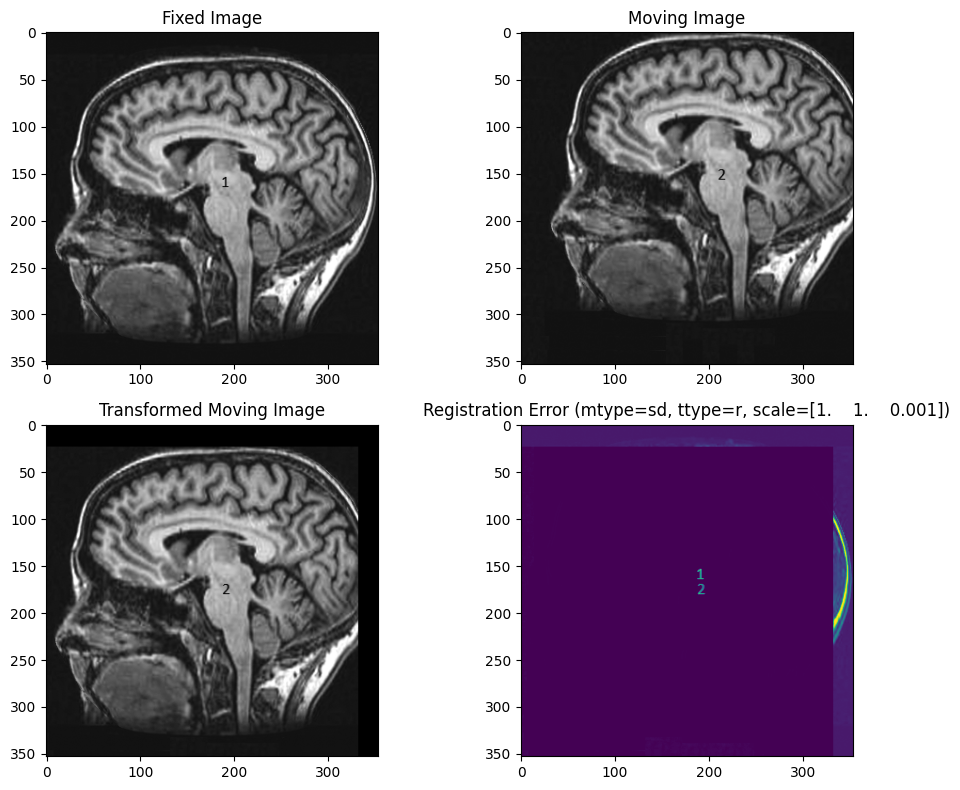

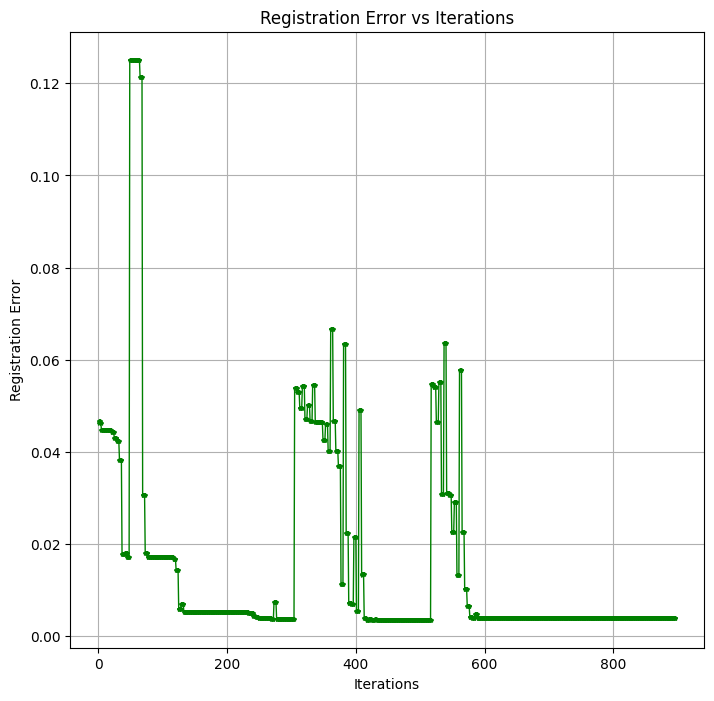


Registration took 5 sec.


In [11]:
start = datetime.datetime.now()
error_list = []
Iregistered, transformation_matrix = multi_affineReg2D(Imoving_path="brain2.png", Ifixed_path="brain1.png", mtype='sd',  ttype='r', tscale=[1, 1, 0.001], epsilon=0.001, order=3, num_resolutions=3)
end = datetime.datetime.now()

print(f'\nRegistration took {(end-start).seconds} sec.')

- **ANSWER 6 Cont'd**:
The multi-resolution approach as observed reduces computation time by working on smaller images in initial steps, allowing for faster convergence.
It also improves accuracy by progressively refining the registration from coarse to fine levels, effectively capturing both global and local features while avoiding overfitting to noise.

# Let's try your implementation

**TASK 4**: Show some registration results using brain1.png, brain2.png, brain3.png, and brain4.png with the different combinations of the registration framework: different <u>metrics</u>, <u>transformations</u> and <u>multi-resolution levels</u>.




**Parameters:**
**Moving Image: brain2.png**
**Fixed Image: brain1.png**
**Number of Resolutions: 5**
**Transformation Type: r**
**Metric Type: ncc**
**tscale: [1, 1, 0.001]**
Final Registration Error: -0.9866543371887927


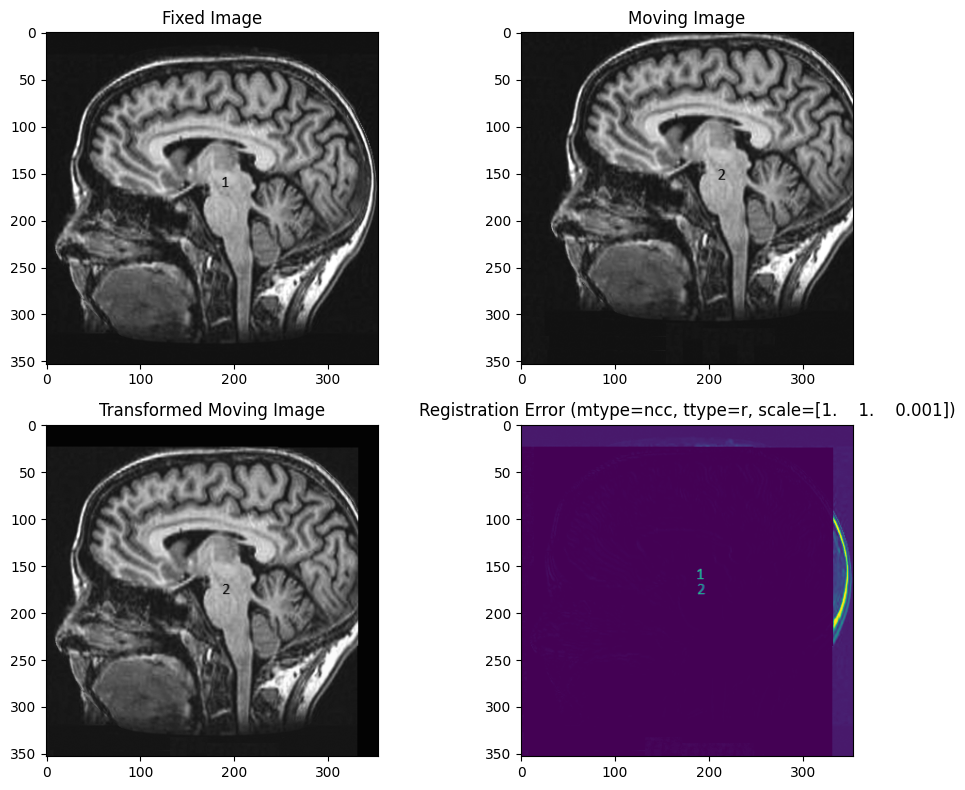

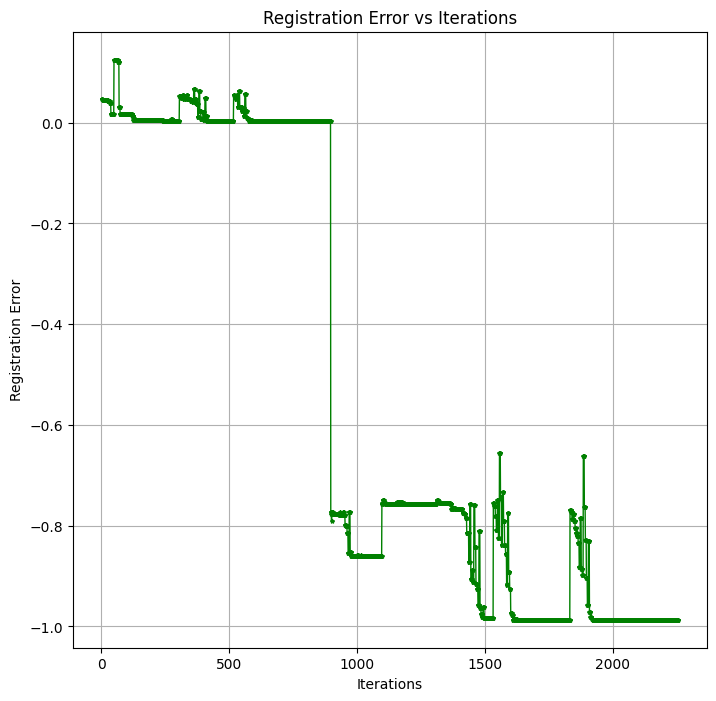


**Registration took 6 sec.**
--------------------------------------------------

**Parameters:**
**Moving Image: brain2.png**
**Fixed Image: brain1.png**
**Number of Resolutions: 5**
**Transformation Type: r**
**Metric Type: ngc**
**tscale: [1, 1, 0.001]**


C:\Users\muham\AppData\Local\Temp\ipykernel_31432\2575729410.py:51: RuntimeWarning: invalid value encountered in divide
  imgA_x_grad = imgA_x_grad/np.max(imgA_x_grad)
C:\Users\muham\AppData\Local\Temp\ipykernel_31432\2575729410.py:52: RuntimeWarning: invalid value encountered in divide
  imgA_y_grad = imgA_y_grad/np.max(imgA_y_grad)


Final Registration Error: -0.3428164117309509


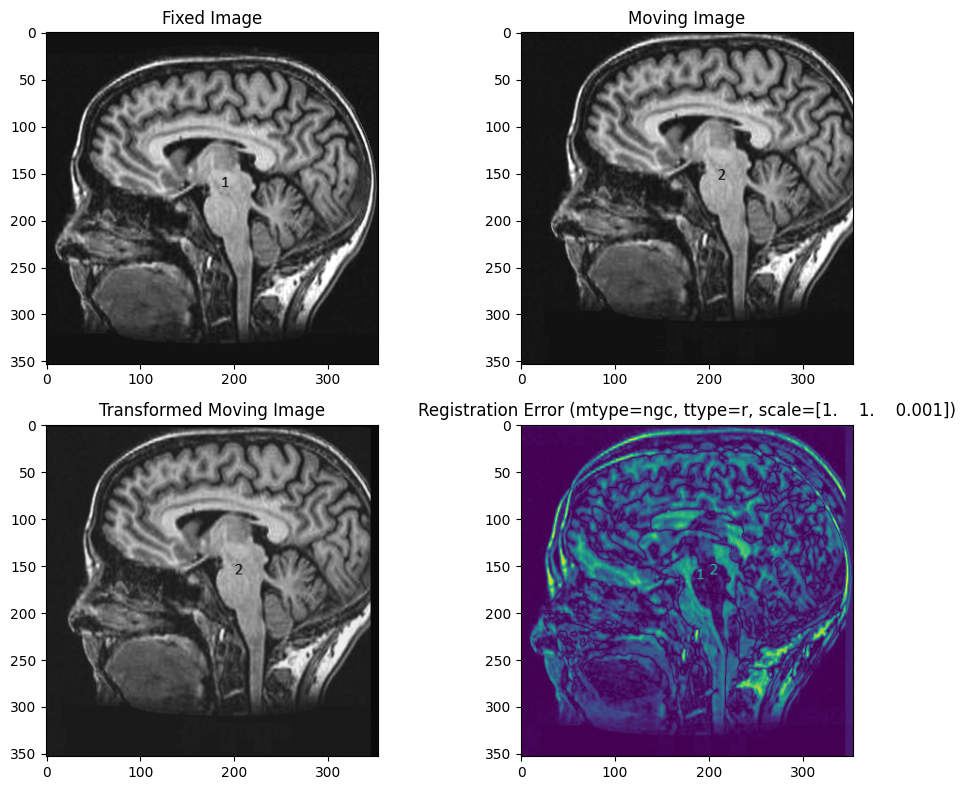

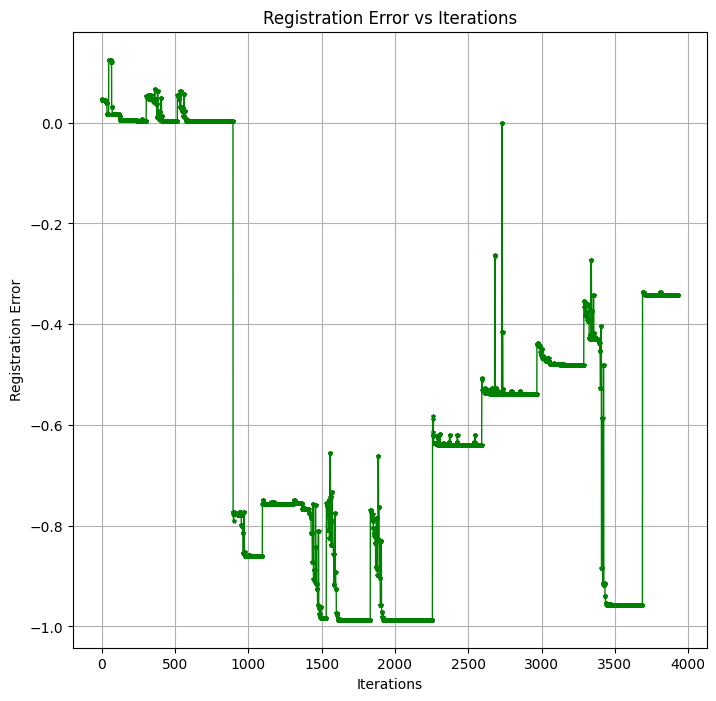


**Registration took 6 sec.**
--------------------------------------------------

**Parameters:**
**Moving Image: brain2.png**
**Fixed Image: brain1.png**
**Number of Resolutions: 5**
**Transformation Type: a**
**Metric Type: ncc**
**tscale: [0.01, 0.01, 0.01, 0.01, 1, 1]**
Final Registration Error: -0.9868260055979059


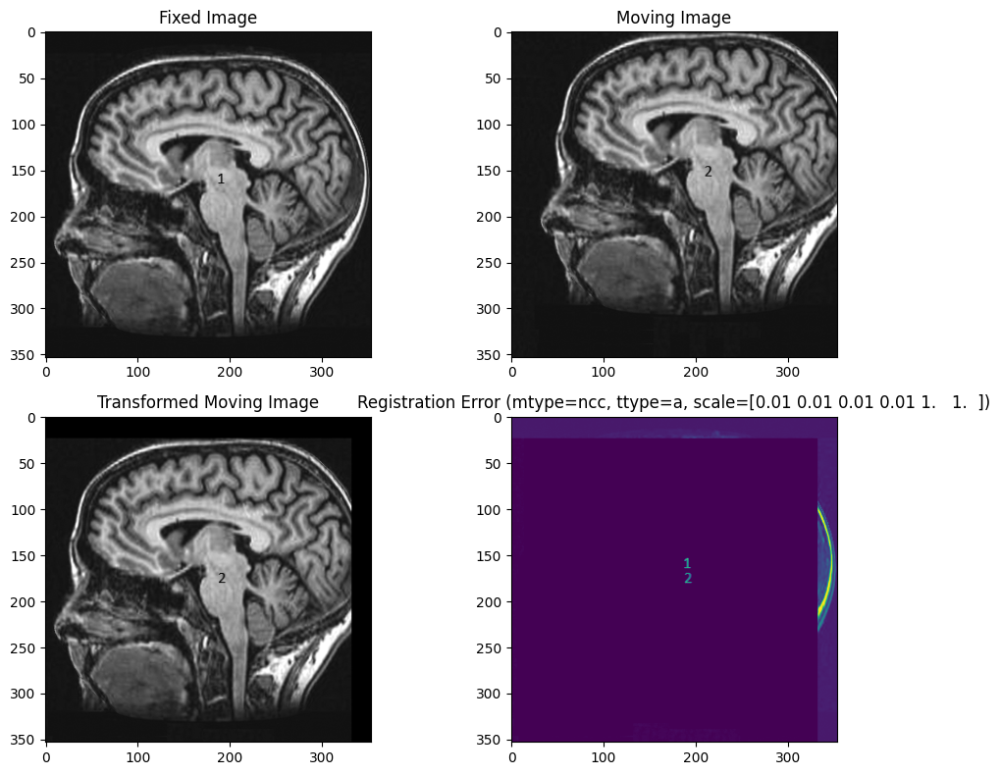

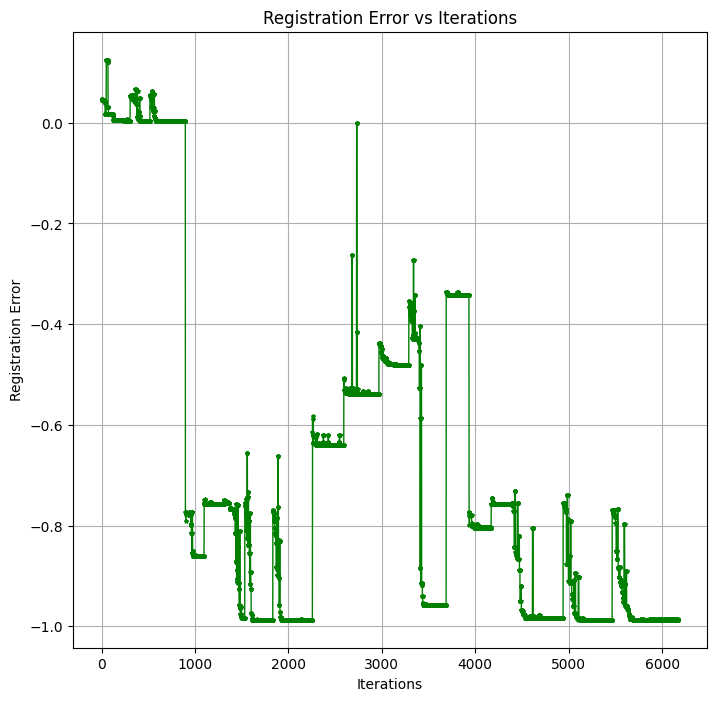


**Registration took 10 sec.**
--------------------------------------------------

**Parameters:**
**Moving Image: brain2.png**
**Fixed Image: brain1.png**
**Number of Resolutions: 5**
**Transformation Type: a**
**Metric Type: ngc**
**tscale: [0.01, 0.01, 0.01, 0.01, 1, 1]**
Final Registration Error: -0.43658986735716593


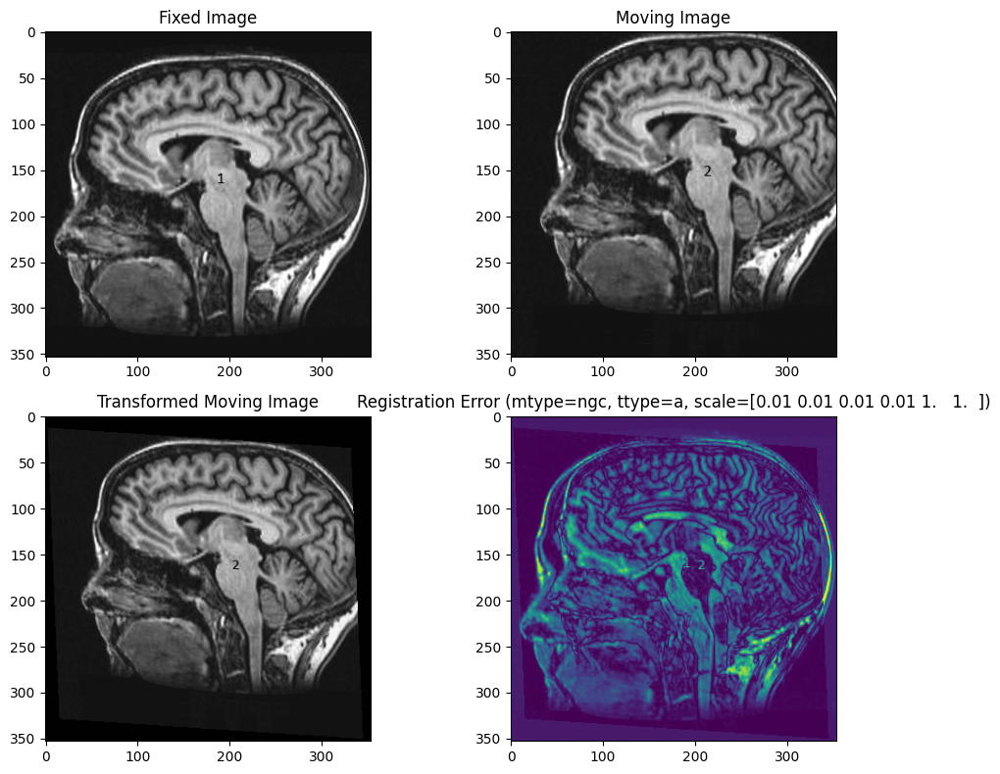

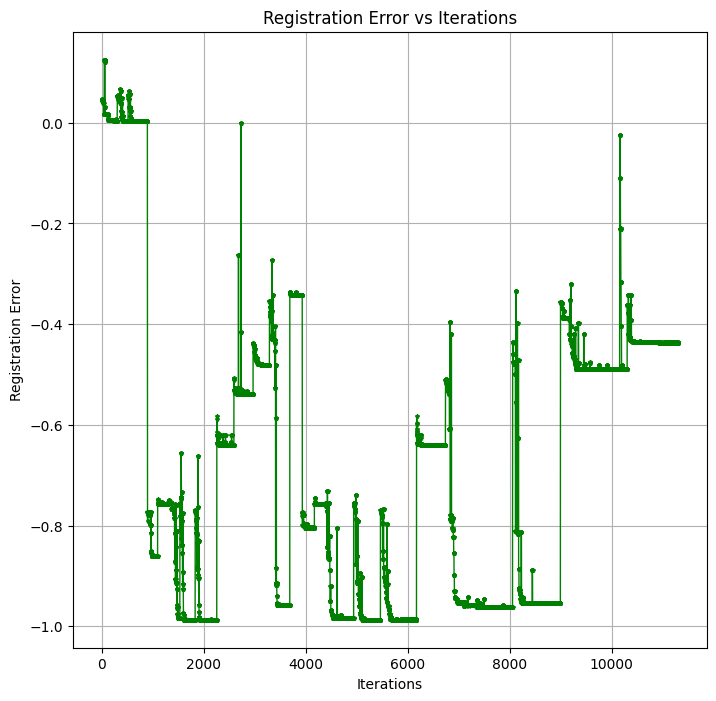


**Registration took 23 sec.**
--------------------------------------------------

**Parameters:**
**Moving Image: brain4.png**
**Fixed Image: brain1.png**
**Number of Resolutions: 5**
**Transformation Type: r**
**Metric Type: ncc**
**tscale: [1, 1, 0.001]**
Final Registration Error: -0.7305389307019642


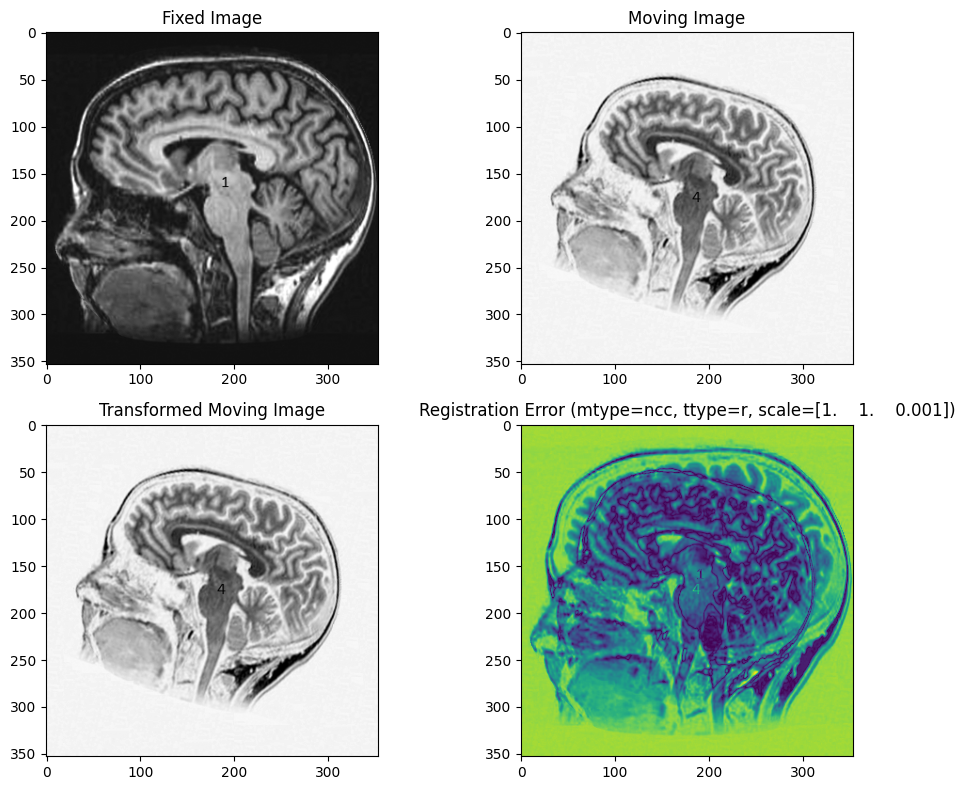

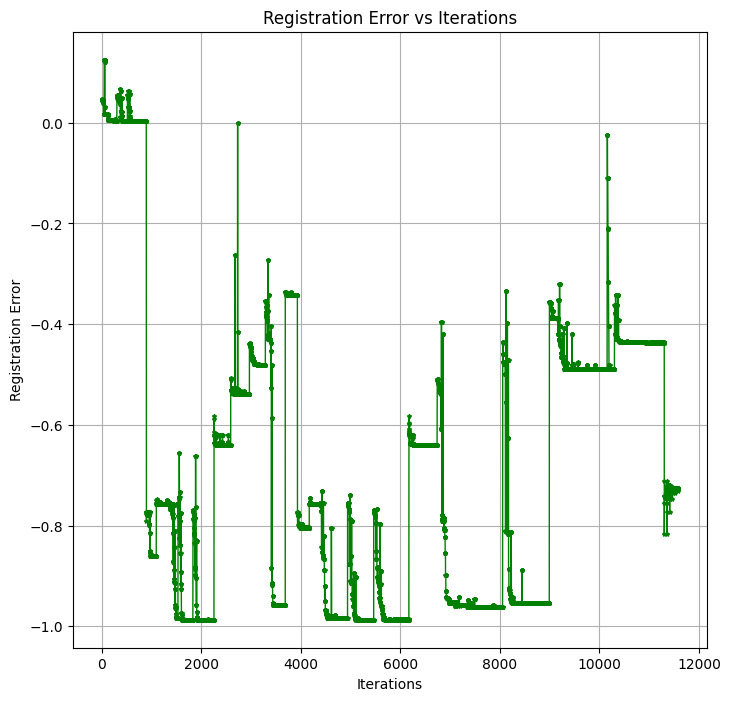


**Registration took 1 sec.**
--------------------------------------------------

**Parameters:**
**Moving Image: brain4.png**
**Fixed Image: brain1.png**
**Number of Resolutions: 5**
**Transformation Type: r**
**Metric Type: ngc**
**tscale: [1, 1, 0.001]**
Final Registration Error: -0.2762014812114533


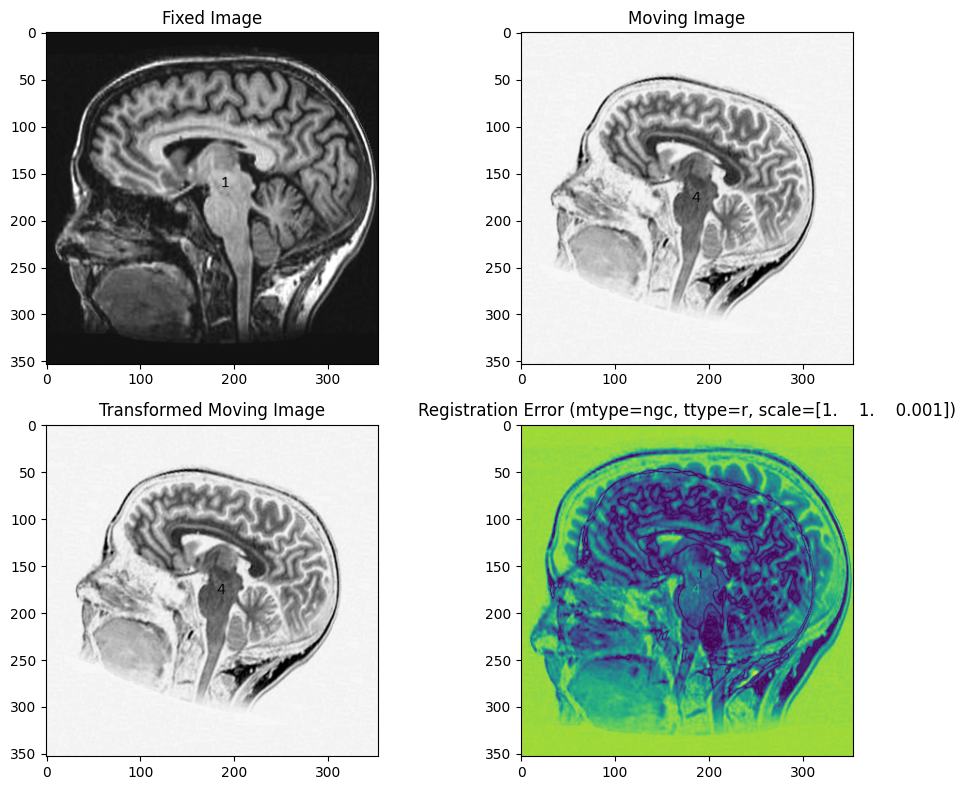

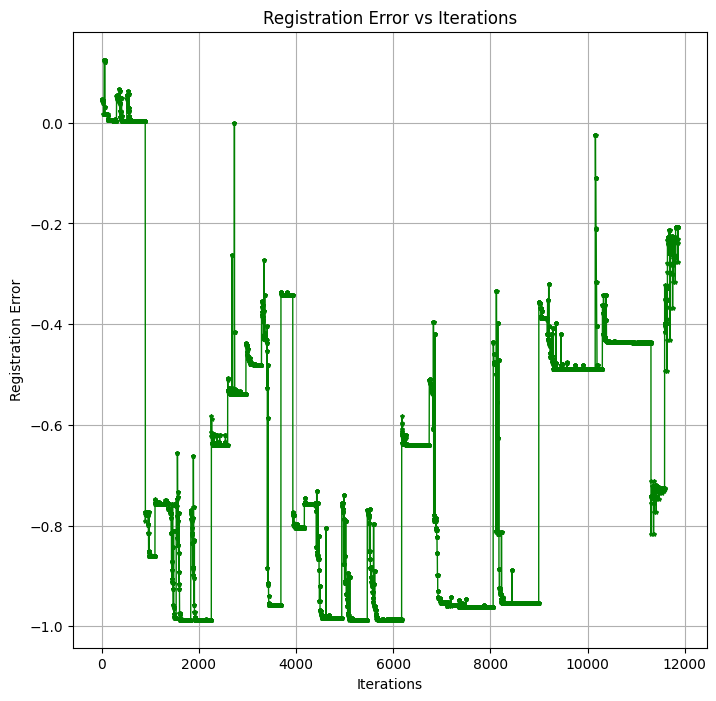


**Registration took 1 sec.**
--------------------------------------------------

**Parameters:**
**Moving Image: brain4.png**
**Fixed Image: brain1.png**
**Number of Resolutions: 5**
**Transformation Type: a**
**Metric Type: ncc**
**tscale: [0.01, 0.01, 0.01, 0.01, 1, 1]**
Final Registration Error: -0.7305389307019642


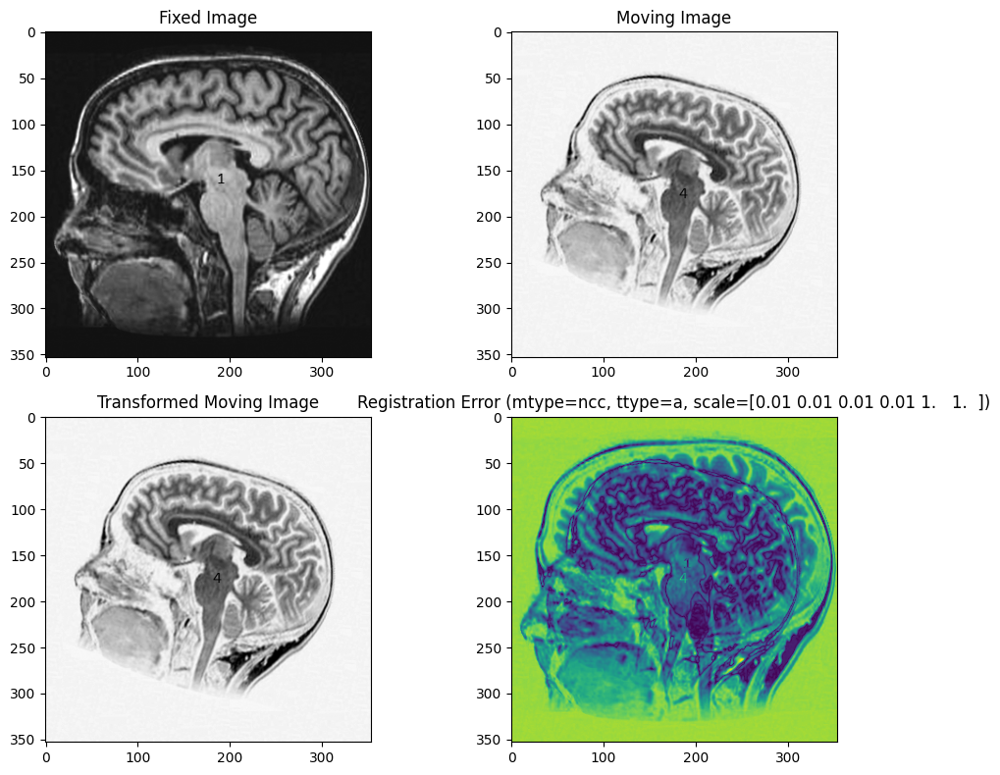

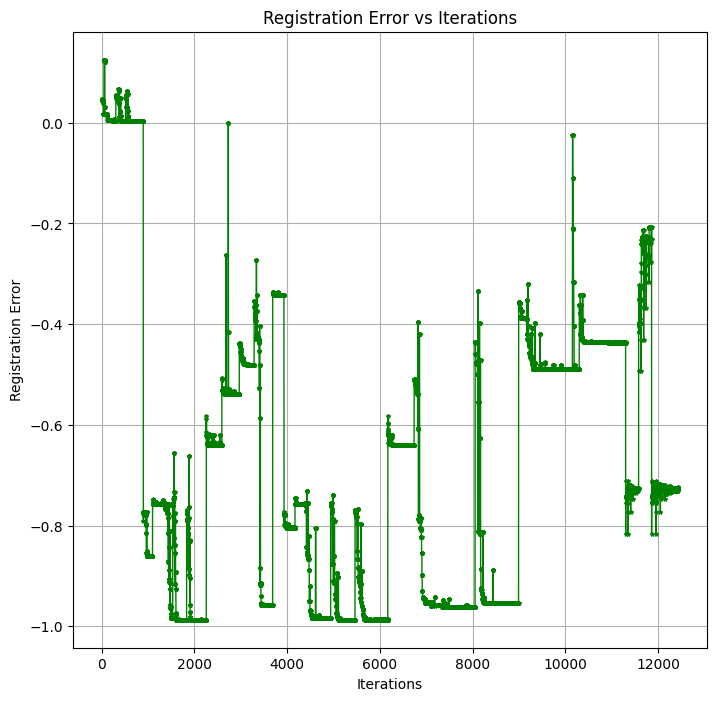


**Registration took 3 sec.**
--------------------------------------------------

**Parameters:**
**Moving Image: brain4.png**
**Fixed Image: brain1.png**
**Number of Resolutions: 5**
**Transformation Type: a**
**Metric Type: ngc**
**tscale: [0.01, 0.01, 0.01, 0.01, 1, 1]**
Final Registration Error: -0.2762014812114533


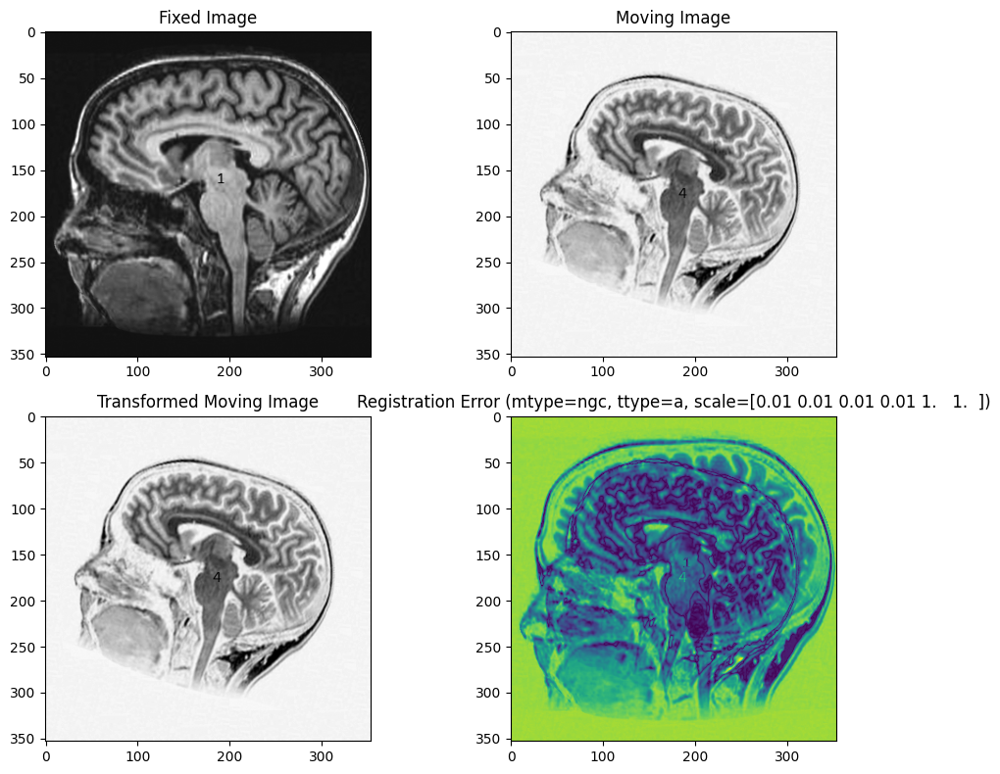

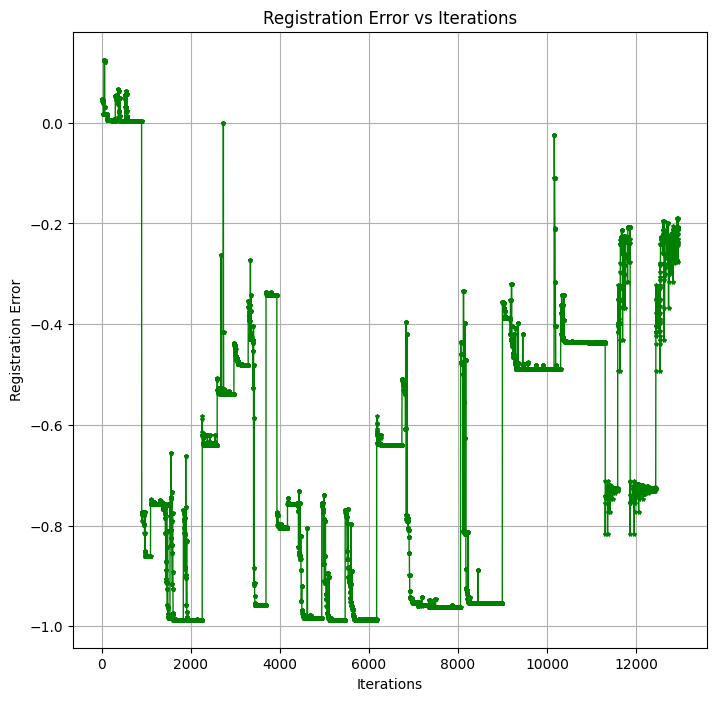


**Registration took 3 sec.**
--------------------------------------------------


In [12]:
moving_images = ["brain2.png", "brain4.png"]
fixed_image = "brain1.png"
resolutions = [5]
ttypes = ['r', 'a']
mtypes = ['ncc', 'ngc']

# Loop through combinations
for moving_img in moving_images:
    for num_res in resolutions:
        for ttype in ttypes:
            for mtype in mtypes:
                # Set tscale based on transformation type
                if ttype == 'r':
                    tscale = [1, 1, 0.001]
                else:  # affine
                    tscale = [0.01, 0.01, 0.01, 0.01, 1, 1]
                
                print(f"\n**Parameters:**")
                print(f"**Moving Image: {moving_img}**")
                print(f"**Fixed Image: {fixed_image}**")
                print(f"**Number of Resolutions: {num_res}**")
                print(f"**Transformation Type: {ttype}**")
                print(f"**Metric Type: {mtype}**")
                print(f"**tscale: {tscale}**")
                
                start = datetime.datetime.now()
                Iregistered, transformation_matrix = multi_affineReg2D(
                    Imoving_path=moving_img, 
                    Ifixed_path=fixed_image, 
                    mtype=mtype,  
                    ttype=ttype, 
                    tscale=tscale, 
                    epsilon=0.001, 
                    order=3, 
                    num_resolutions=num_res
                )
                end = datetime.datetime.now()
                
                print(f'\n**Registration took {(end-start).seconds} sec.**')
                print("-" * 50)

**TASK 5**: For selected (representative) cases, plot the metric against iterations, computation time, registration results and final error (<u>propose a quantitative error measure</u>).

Final Registration Error: 0.0038705637492719544


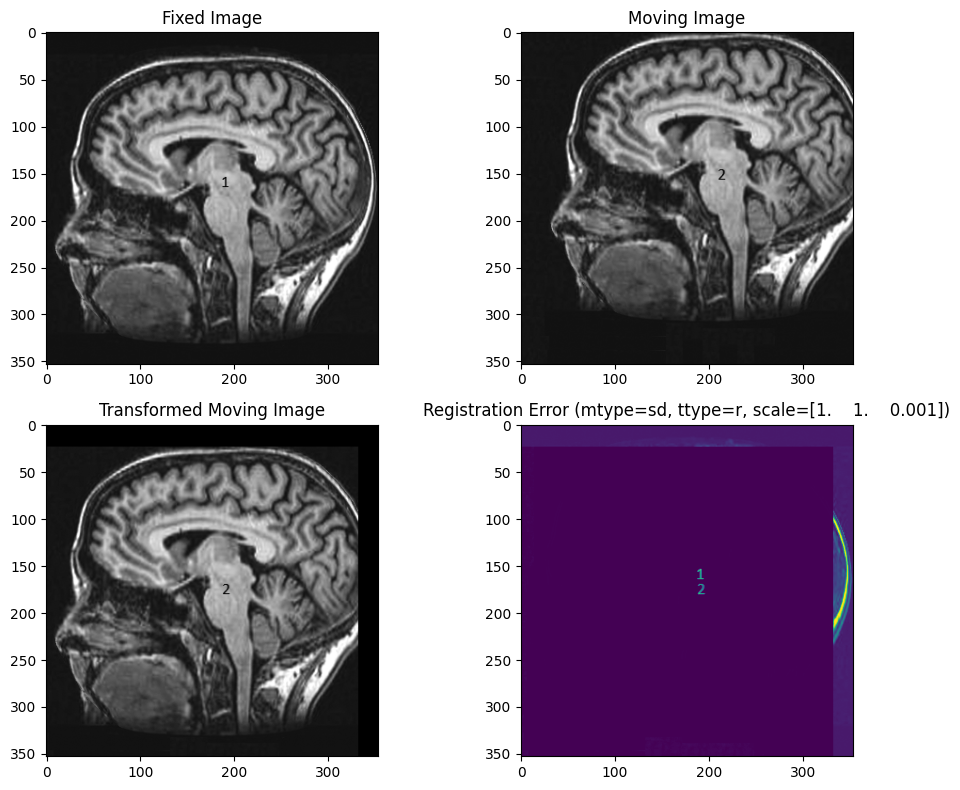

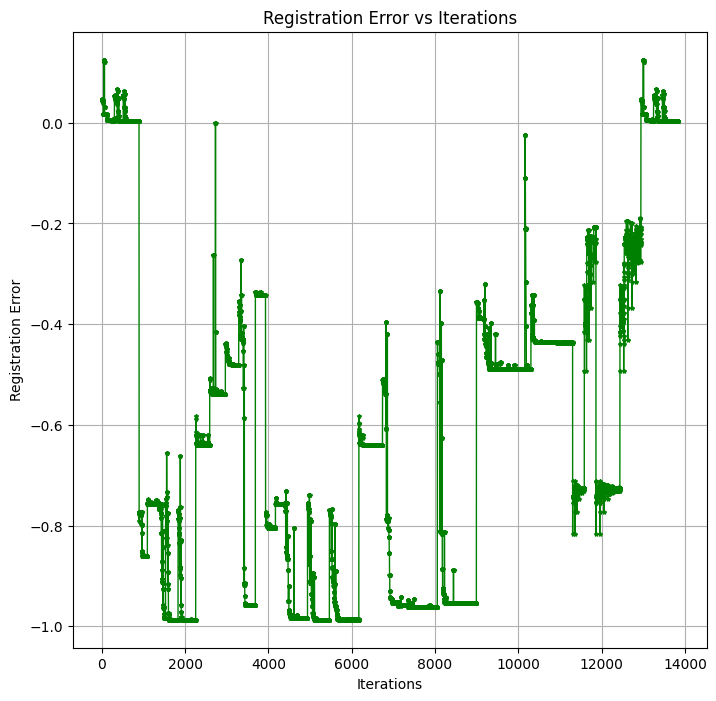


 Total Registration took 4 sec.


In [13]:
start = datetime.datetime.now()
Iregistered, transformation_matrix = multi_affineReg2D(Imoving_path="brain2.png", Ifixed_path="brain1.png", mtype='sd', ttype='r', tscale=[1, 1, 0.001], epsilon=0.001, order=3, num_resolutions=3)
end = datetime.datetime.now()

print(f'\n Total Registration took {(end-start).seconds} sec.')

Final Registration Error: -0.9868247427483426


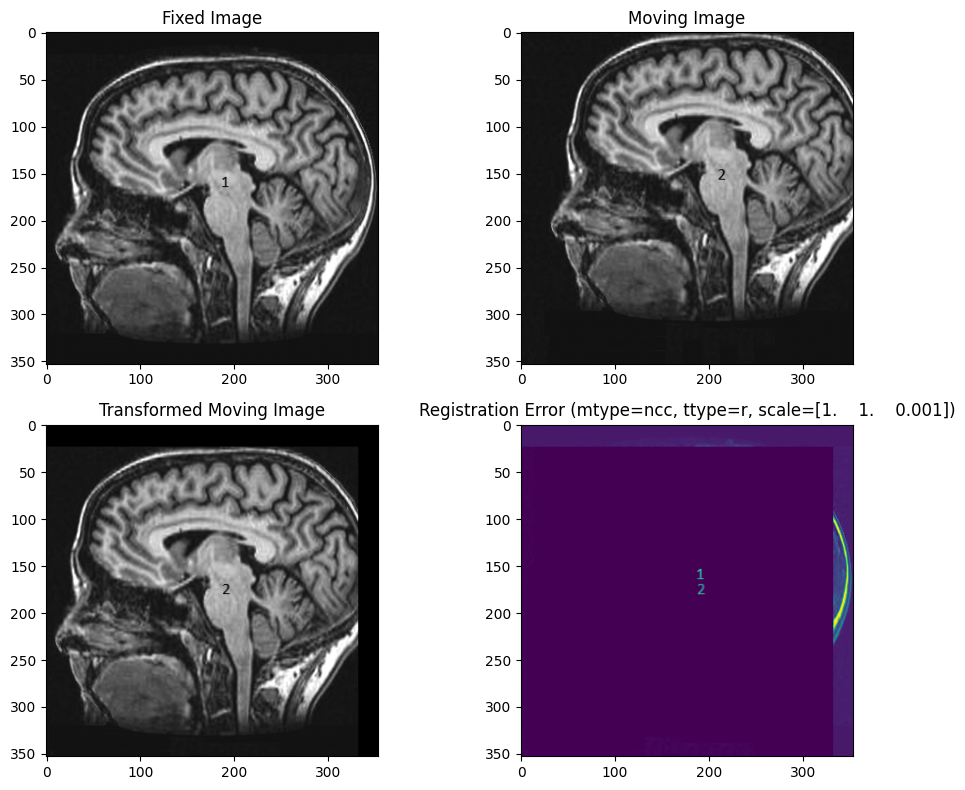

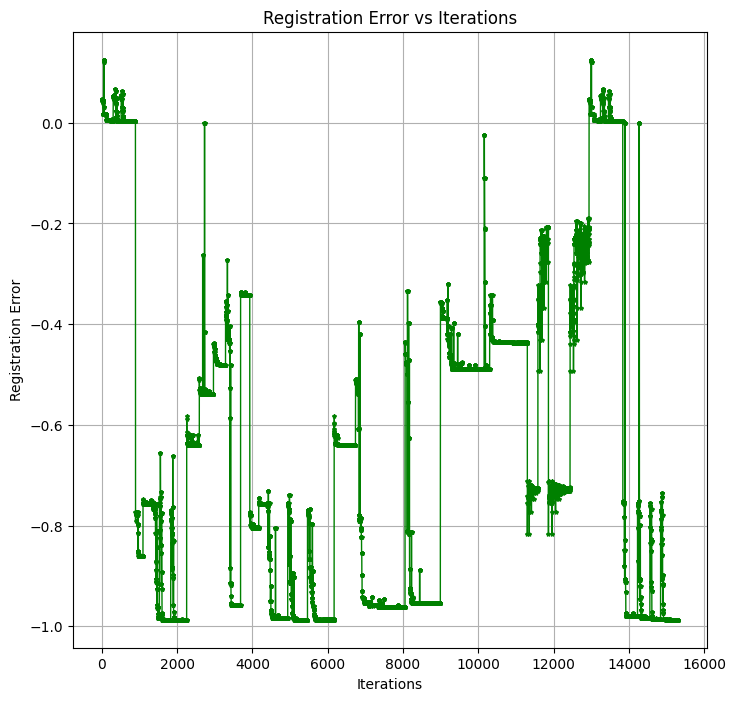


 Total Registration took 6 sec.


In [14]:
start = datetime.datetime.now()
Iregistered, transformation_matrix = multi_affineReg2D(Imoving_path="brain2.png", Ifixed_path="brain1.png", mtype='ncc', ttype='r', tscale=[1, 1, 0.001], epsilon=0.001, order=3, num_resolutions=4)
end = datetime.datetime.now()

print(f'\n Total Registration took {(end-start).seconds} sec.')

Final Registration Error: 0.0038750790273983913


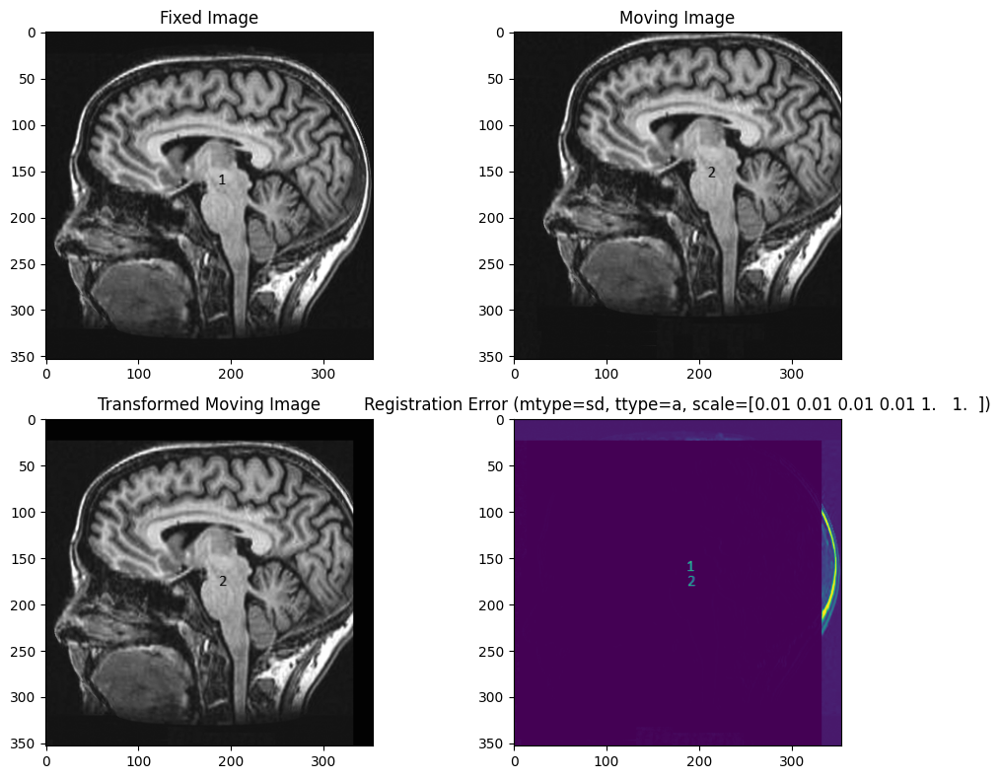

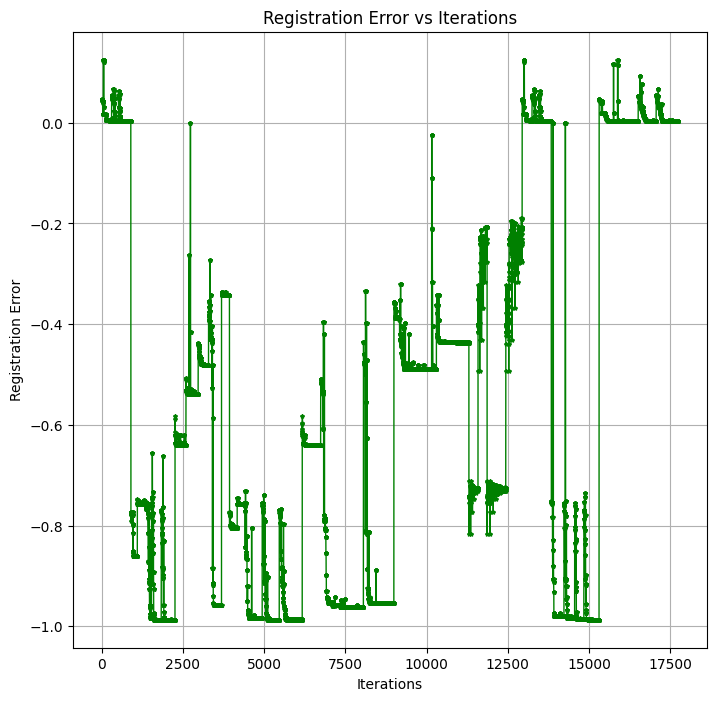


 Total Registration took 9 sec.


In [15]:
start = datetime.datetime.now()
Iregistered, transformation_matrix = multi_affineReg2D(Imoving_path="brain2.png", Ifixed_path="brain1.png", mtype='sd', ttype='a', tscale=[0.01, 0.01, 0.01, 0.01, 1, 1], epsilon=0.001, order=3, num_resolutions=3)
end = datetime.datetime.now()

print(f'\n Total Registration took {(end-start).seconds} sec.')

Final Registration Error: -0.7621813011123237


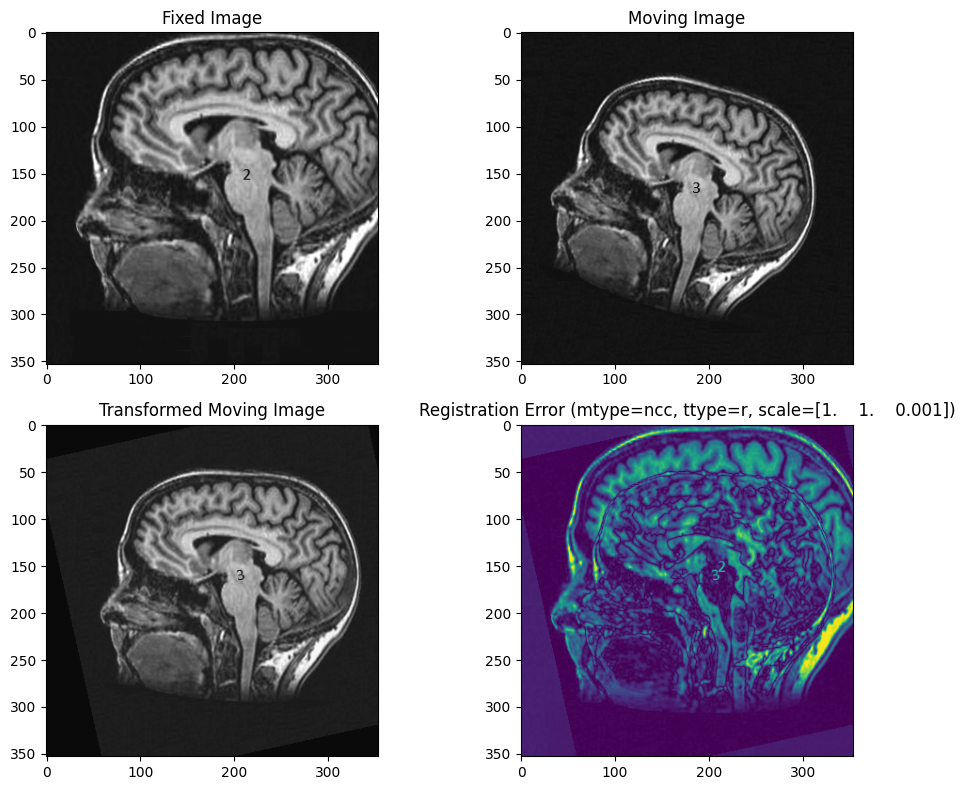

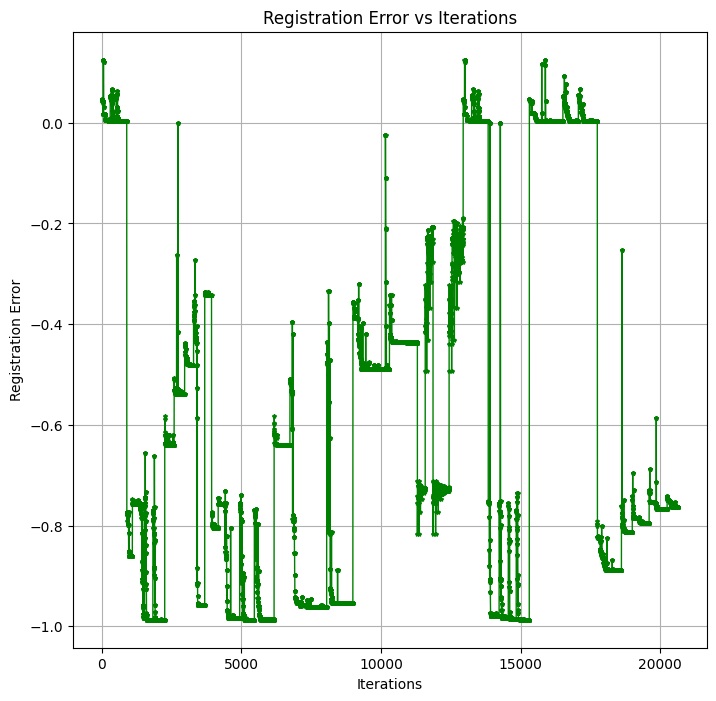


 Total Registration took 8 sec.


In [16]:
start = datetime.datetime.now()
Iregistered, transformation_matrix = multi_affineReg2D(Imoving_path="brain3.png", Ifixed_path="brain2.png", mtype='ncc', ttype='r', tscale=[1, 1, 0.001], epsilon=0.001, order=3, num_resolutions=5)
end = datetime.datetime.now()

print(f'\n Total Registration took {(end-start).seconds} sec.')

Final Registration Error: -0.9958025964094324


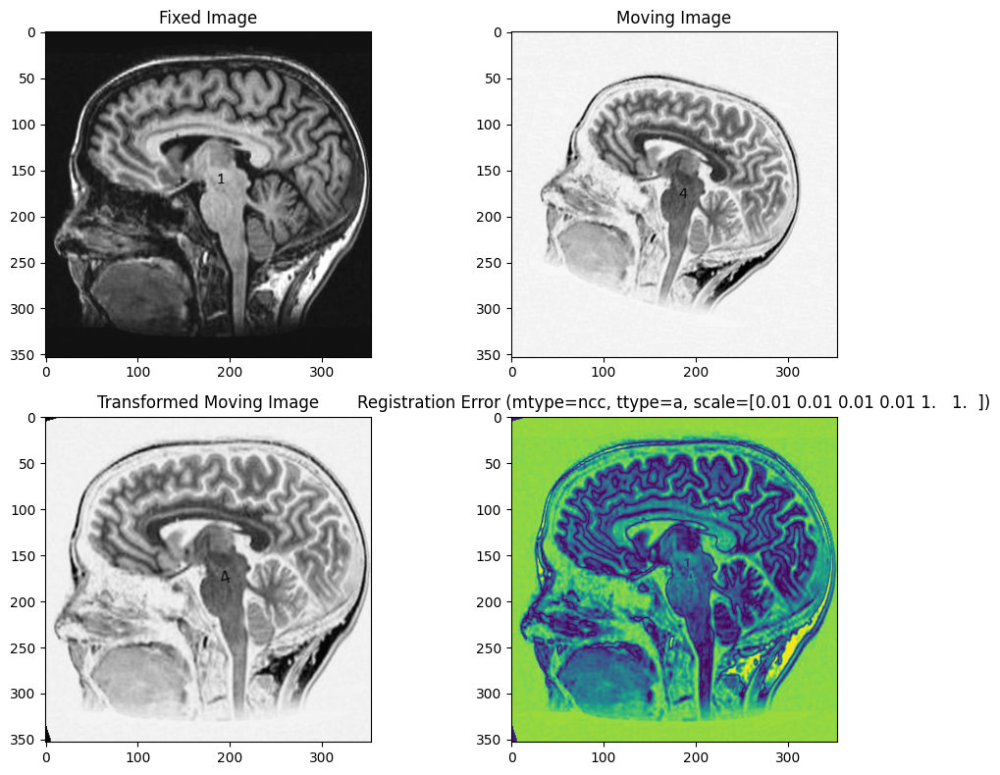

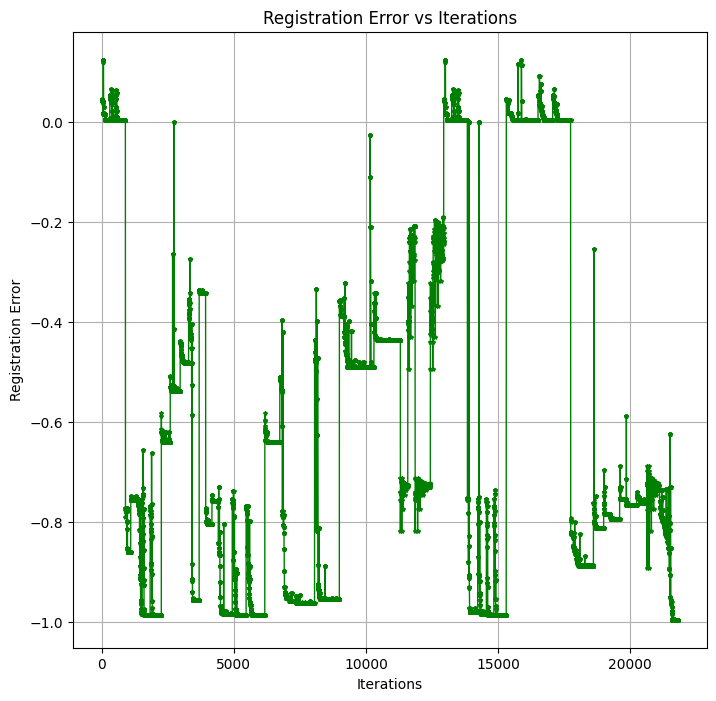


 Total Registration took 10 sec.


In [17]:
start = datetime.datetime.now()
Iregistered, transformation_matrix = multi_affineReg2D(Imoving_path="brain4.png", Ifixed_path="brain1.png", mtype='ncc', ttype='a', tscale=[0.01, 0.01, 0.01, 0.01, 1, 1], epsilon=0.01, order=3, num_resolutions=6)
end = datetime.datetime.now()

print(f'\n Total Registration took {(end-start).seconds} sec.')

Final Registration Error: -0.9976625351364204


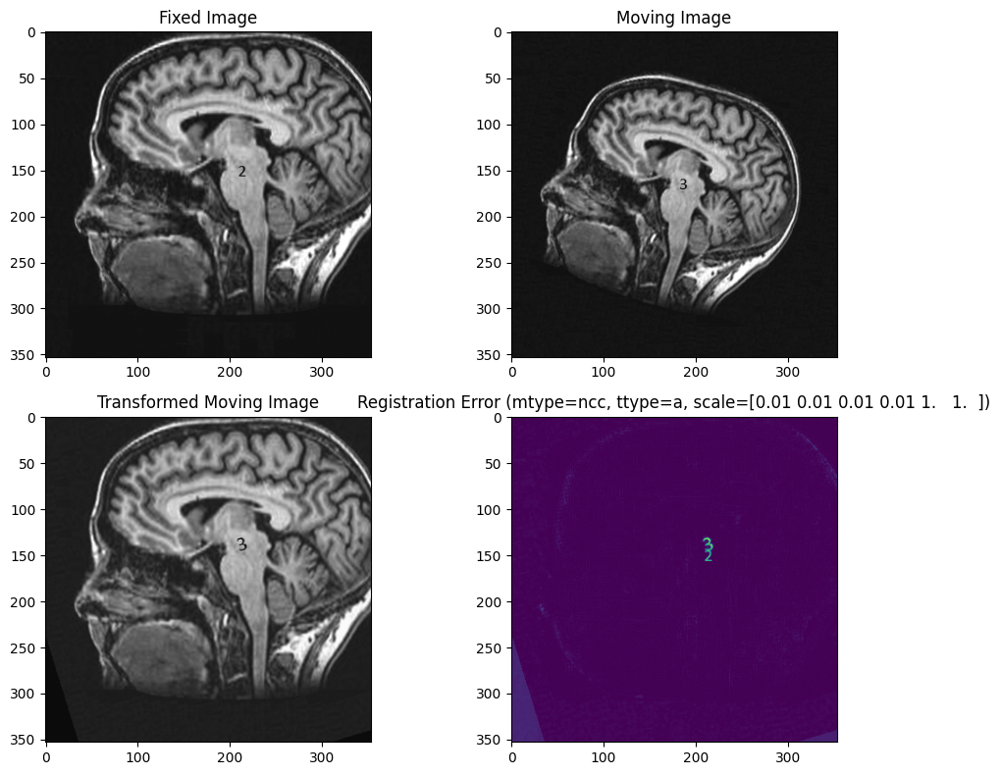

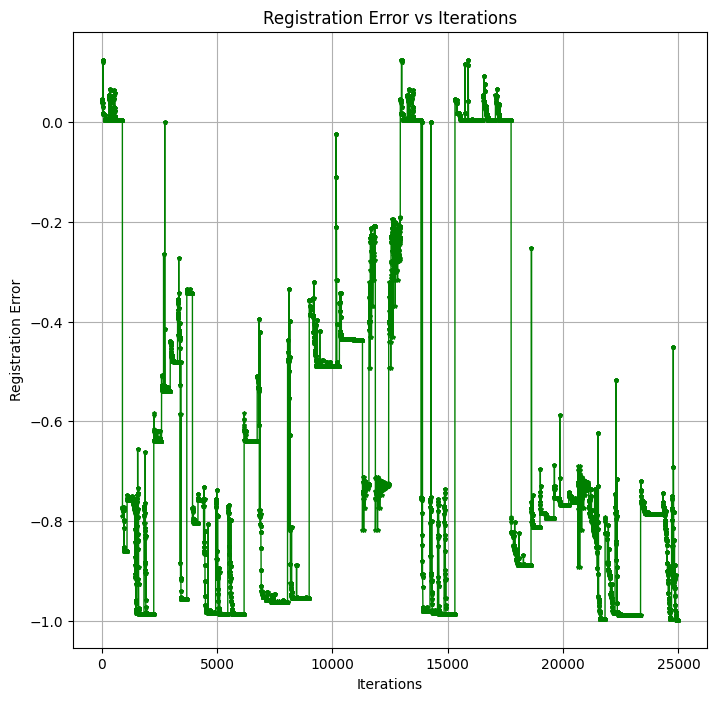


 Total Registration took 6 sec.


In [18]:
start = datetime.datetime.now()
Iregistered, transformation_matrix = multi_affineReg2D(Imoving_path="brain3.png", Ifixed_path="brain2.png", mtype='ncc', ttype='a', tscale=[0.01, 0.01, 0.01, 0.01, 1, 1], epsilon=0.001, order=3, num_resolutions=5)
end = datetime.datetime.now()

print(f'\n Total Registration took {(end-start).seconds} sec.')

Final Registration Error: -0.7386568573004881


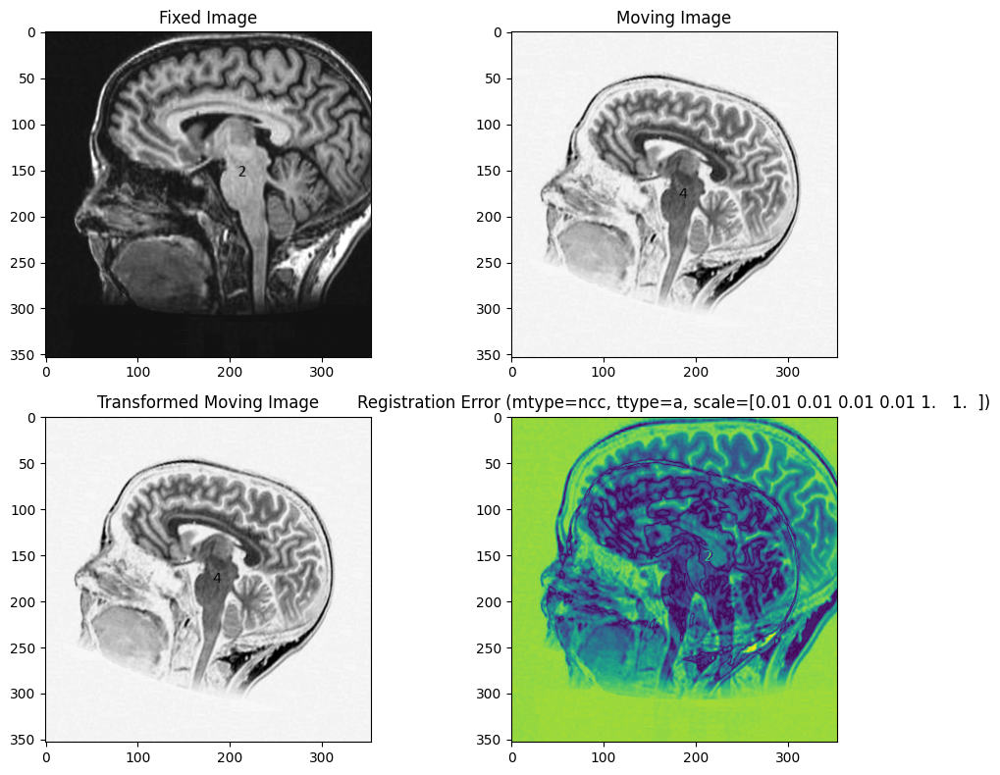

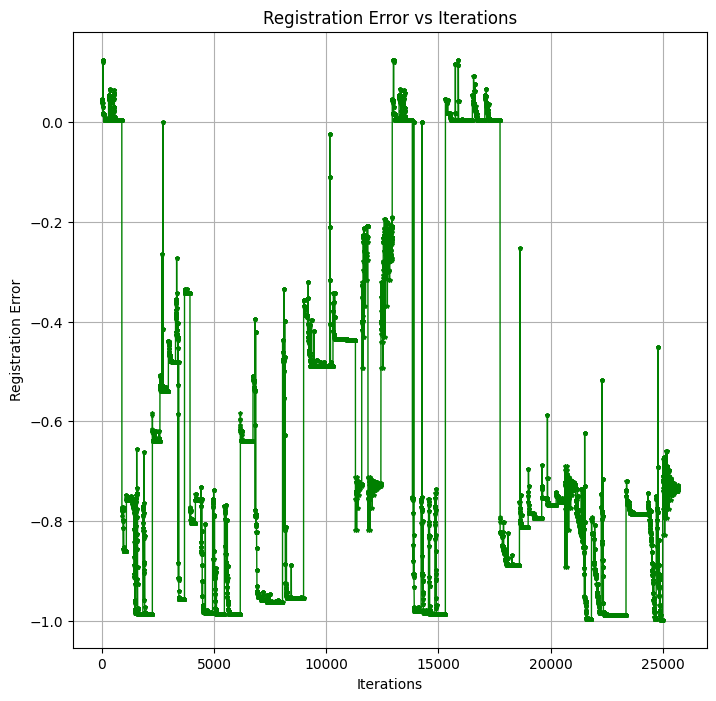


 Total Registration took 3 sec.


In [19]:
start = datetime.datetime.now()
Iregistered, transformation_matrix = multi_affineReg2D(Imoving_path="brain4.png", Ifixed_path="brain2.png", mtype='ncc', ttype='a', tscale=[0.01, 0.01, 0.01, 0.01, 1, 1], epsilon=0.001, order=3, num_resolutions=6)
end = datetime.datetime.now()

print(f'\n Total Registration took {(end-start).seconds} sec.')

Final Registration Error: -0.27610613133813916


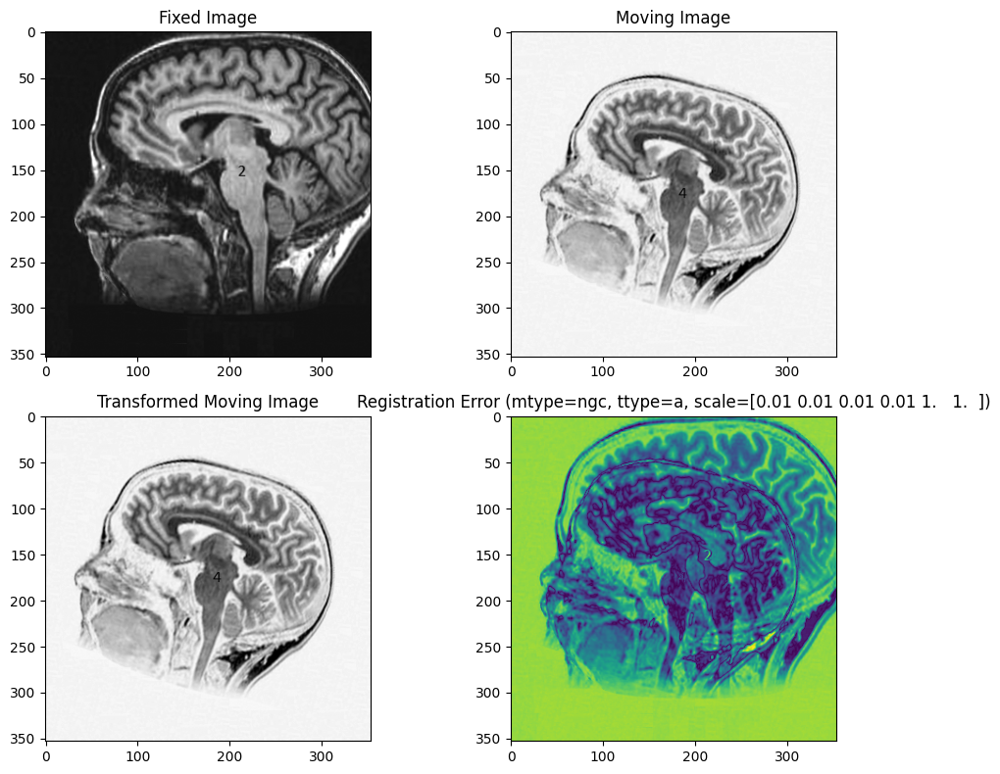

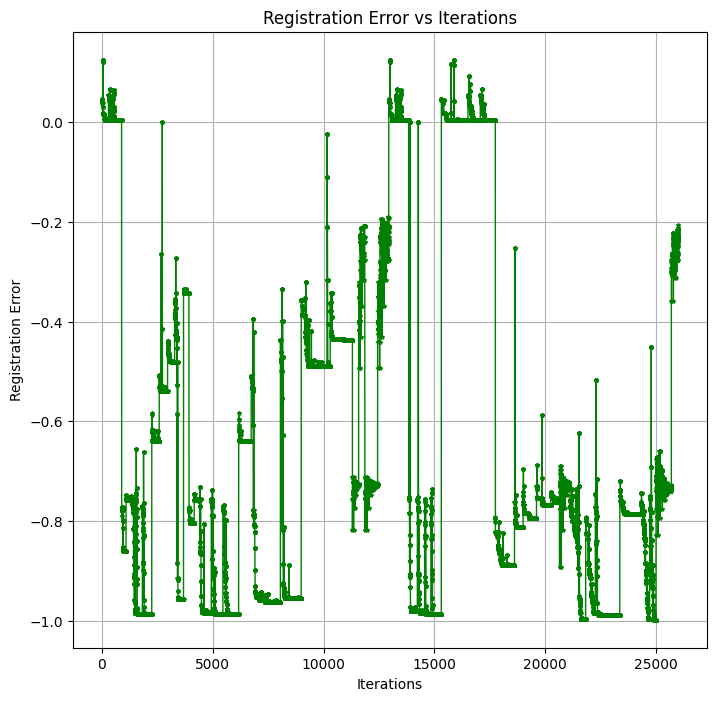


 Total Registration took 2 sec.


In [20]:
start = datetime.datetime.now()
Iregistered, transformation_matrix = multi_affineReg2D(Imoving_path="brain4.png", Ifixed_path="brain2.png", mtype='ngc', ttype='a', tscale=[0.01, 0.01, 0.01, 0.01, 1, 1], epsilon=0.001, order=3, num_resolutions=3)
end = datetime.datetime.now()

print(f'\n Total Registration took {(end-start).seconds} sec.')

An appropraite quantitative error measure could be mutual information

**QUESTION 7**: Are the results what you were expecting? If not, explain why.

*Your answer here*
- **ANSWER 7**: No. Not all metrics performed well. Particularly, ngc failed to converge in some cases leading to bad registration. I expected that it would perform better on the images with inverse intensities since it uses gradient information, but that isn't the case. In other cases, the algorithm got stuck in a local minima because of the choice of some hyperparameters. For instance, changing the solver method from ```L-BFGS-B``` to ```Powell``` keeping all other things constant gave different result. Simple hyperparaters such as scale, resolution level or order also decide the outcome of the registration. Hence, the choice of these parameters are directly impacting the performance. Also, the differences in the images orientation and intensities determines how many iterations and the result of the registration.